In [1]:
import pandas as pd
import numpy as np
from scipy.stats import uniform

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate, StratifiedKFold, KFold, RandomizedSearchCV
from sklearn.metrics import roc_auc_score, precision_score, recall_score, roc_curve,fbeta_score, confusion_matrix
from sklearn.linear_model import SGDClassifier
import math
import random
import sklearn.metrics as metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.svm import SVR

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.metrics import roc_auc_score, roc_curve

import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import LGBMRegressor

import shap

import joblib
from joblib import dump

import pickle

In [2]:
pd.set_option("max_rows", None)
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)

In [3]:
SEED = np.random.seed(5)
cv_train = KFold(n_splits = 5, shuffle = True, random_state = SEED)
score = ('r2','neg_mean_absolute_error')

# Modélisation

Maintenant que nous avons nos datasets finaux nous allons nous intéresser à différents modèles, pour ces modèles nous utiliserons HyperOpt et GridSearchCV afin d'optimiser ces derniers, nous allons donc charger cette bibliothèque dans un premier temps:

In [4]:
#!pip install hyperopt
from hyperopt import hp

Dans un premier temps chargons les datasets train_data, test_data et target_train que l'on récupérera de la partie Feature Engeneering précèdente. Nos datasets sont déjà réduits en utilisant la RFE (Recursive Feature Elimination) et plus particulièrement LightGBM.

In [5]:
train_data = joblib.load(r'C:\Users\Alexis\train_dataID.joblib')
test_data = joblib.load(r'C:\Users\Alexis\test_dataID.joblib')

In [6]:
train_data.shape

(307507, 1112)

In [7]:
train_data.head(5)

,CNT_INSTALMENT_MEAN_YEAR_0_MAX,CNT_PAYMENT_MEAN_ALL,BUREAU_AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL_INCOME_RATIO,EXT_SOURCE_MEAN_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,PRODUCT_COMBINATION_MEAN_ALL,YEARS_BUILD_MODE,PAYMENT_MIN_DIFF_MIN_YEAR_0,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,INTEREST_DOWNPAYMENT_MEAN_LAST_5,AMT_ANNUITY_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,WEIGHTED_STATUS_MEAN_YEAR_0_MEAN_OVERALL,TOTAL_TERM_MAX_YEAR_0_MEAN,APARTMENTS_SUM_MEDI_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_DIFF_MIN_LAST_1_YEAR,HOUR_APPR_PROCESS_START_MEAN_LAST_5,AMT_INTEREST_RECEIVABLE_MIN_YEAR_0,AMT_REQ_CREDIT_BUREAU_MON,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,CNT_INSTALMENT_MATURE_CUM_SUM,MISSING_VALS_TOTAL_APP,DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE,CNT_INSTALMENT_MATURE_CUM_MAX,BUREAU_DAYS_CREDIT_MEAN_OVERALL_REGISTRATION_DIFF,NAME_PRODUCT_TYPE_MEAN_ALL,TOTAL_TERM_LAST_MEAN,EXT_SOURCE_MEAN_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_SUM_LAST_5,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,APARTMENTS_AVG,ENTRANCES_AVG,DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED,EXP_PAYMENT_MIN_DIFF_LAST,EXP_CNT_INSTALMENT_LAST_YEAR_0_MEAN,AGE_EMPLOYED_DIFF_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,FLOORSMAX_MODE,CNT_INSTALMENT_FUTURE_MAX_ACTIVE_MEAN,EXT_SOURCE_3_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,DEF_30_CREDIT_RATIO,TOTAL_TERM_MEAN_YEAR_0_MAX,INTEREST_DOWNPAYMENT_MAX_ALL,WEEKDAY_APPR_PROCESS_START_MEAN_ALL,INTEREST_SHARE_MAX_ALL,FLAG_DOCUMENT_17,TOTAL_TERM_MAX_YEAR_1_MEAN,NAME_TYPE_SUITE_LAST_FIRST_2,CHANNEL_TYPE_MEAN_ALL,SK_DPD_MAX_YEAR_0_MEAN,EXP_DAYS_PAYMENT_DIFF_LAST_LAST_1_YEAR,MIN_PAYMENT_TOTAL_RATIO_MIN_YEAR_0,AMT_CREDIT_GOODS_DIFF_MEAN_LAST_5,AMT_PAYMENT_MEAN_FIRST_5_INSTALLMENTS,SELLERPLACE_AREA_MIN_LAST_5,EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,RATE_DOWN_PAYMENT_MAX_FIRST_2,GOOD_DOWNPAYMET_RATIO_MAX_FIRST_2,NAME_CONTRACT_TYPE_MEAN_ALL,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXT_SOURCE_2_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,CNT_INSTALMENT_MAX_YEAR_0_MEAN,EXP_ENCODED_STATUS_LAST_YEAR_REST_MEAN_OVERALL,CNT_INSTALMENT_FUTURE_MIN_MEAN,CNT_INSTALMENT_MEAN_YEAR_0_SUM,HOUR_APPR_PROCESS_START_MEAN_FIRST_2,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_CLOSED_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,PREV_AMT_GOODS_PRICE_SUM_ALL_INCOME_RATIO,APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,OCCUPATION_TYPE_1,HOUR_APPR_PROCESS_START_MAX_ALL,PREV_AMT_ANNUITY_MAX_ALL_INCOME_RATIO,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,FLAG_DOCUMENT_6,OBS_DEF_30_MUL,AMT_ANNUITY_MEAN_ALL,SELLERPLACE_AREA_MEAN_LAST_5,ANNUITY_INCOME_RATIO_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,DAYS_FIRST_DUE_MAX_ALL,EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,FLAG_DOCUMENT_18,INCOME_APARTMENT_MEDI_MUL,DAYS_DECISION_MIN_LAST_5,INTEREST_SHARE_MAX_LAST_5,AMT_CREDIT_SUM_LIMIT_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_YIELD_GROUP_SUM_LAST_5,EXP_AMT_RECEIVABLE_PRINCIPAL_LAST,INCOME_ANNUITY_DIFF,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_SUM_MAX_RATIO,EXT_SOURCE_MEAN_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,EXT_SOURCE_2_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_ANNUITY_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,EXP_PAYMENT_MIN_DIFF_LAST_ACTIVE,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE_INCOME_RATIO,NUM_INSTALMENT_VERSION_MEAN_MEAN,NAME_CONTRACT_STATUS_MEAN_LAST_5,NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2,CC_EXP_AMT_TOTAL_RECEIVABLE_LAST_INCOME_RATIO,INTEREST_SHARE_MIN_ALL,AMT_PAYMENT_TOTAL_CURRENT_MAX,MISSING_VALUES_TOTAL_PREV_SUM_ALL,CNT_INSTALMENT_M

In [8]:
test_data.shape

(48744, 1112)

In [9]:
test_data.head(5)

,CNT_INSTALMENT_MEAN_YEAR_0_MAX,CNT_PAYMENT_MEAN_ALL,BUREAU_AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL_INCOME_RATIO,EXT_SOURCE_MEAN_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,PRODUCT_COMBINATION_MEAN_ALL,YEARS_BUILD_MODE,PAYMENT_MIN_DIFF_MIN_YEAR_0,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,INTEREST_DOWNPAYMENT_MEAN_LAST_5,AMT_ANNUITY_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,WEIGHTED_STATUS_MEAN_YEAR_0_MEAN_OVERALL,TOTAL_TERM_MAX_YEAR_0_MEAN,APARTMENTS_SUM_MEDI_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_DIFF_MIN_LAST_1_YEAR,HOUR_APPR_PROCESS_START_MEAN_LAST_5,AMT_INTEREST_RECEIVABLE_MIN_YEAR_0,AMT_REQ_CREDIT_BUREAU_MON,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,CNT_INSTALMENT_MATURE_CUM_SUM,MISSING_VALS_TOTAL_APP,DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE,CNT_INSTALMENT_MATURE_CUM_MAX,BUREAU_DAYS_CREDIT_MEAN_OVERALL_REGISTRATION_DIFF,NAME_PRODUCT_TYPE_MEAN_ALL,TOTAL_TERM_LAST_MEAN,EXT_SOURCE_MEAN_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_SUM_LAST_5,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,APARTMENTS_AVG,ENTRANCES_AVG,DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED,EXP_PAYMENT_MIN_DIFF_LAST,EXP_CNT_INSTALMENT_LAST_YEAR_0_MEAN,AGE_EMPLOYED_DIFF_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,FLOORSMAX_MODE,CNT_INSTALMENT_FUTURE_MAX_ACTIVE_MEAN,EXT_SOURCE_3_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,DEF_30_CREDIT_RATIO,TOTAL_TERM_MEAN_YEAR_0_MAX,INTEREST_DOWNPAYMENT_MAX_ALL,WEEKDAY_APPR_PROCESS_START_MEAN_ALL,INTEREST_SHARE_MAX_ALL,FLAG_DOCUMENT_17,TOTAL_TERM_MAX_YEAR_1_MEAN,NAME_TYPE_SUITE_LAST_FIRST_2,CHANNEL_TYPE_MEAN_ALL,SK_DPD_MAX_YEAR_0_MEAN,EXP_DAYS_PAYMENT_DIFF_LAST_LAST_1_YEAR,MIN_PAYMENT_TOTAL_RATIO_MIN_YEAR_0,AMT_CREDIT_GOODS_DIFF_MEAN_LAST_5,AMT_PAYMENT_MEAN_FIRST_5_INSTALLMENTS,SELLERPLACE_AREA_MIN_LAST_5,EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,RATE_DOWN_PAYMENT_MAX_FIRST_2,GOOD_DOWNPAYMET_RATIO_MAX_FIRST_2,NAME_CONTRACT_TYPE_MEAN_ALL,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXT_SOURCE_2_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,CNT_INSTALMENT_MAX_YEAR_0_MEAN,EXP_ENCODED_STATUS_LAST_YEAR_REST_MEAN_OVERALL,CNT_INSTALMENT_FUTURE_MIN_MEAN,CNT_INSTALMENT_MEAN_YEAR_0_SUM,HOUR_APPR_PROCESS_START_MEAN_FIRST_2,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_CLOSED_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,PREV_AMT_GOODS_PRICE_SUM_ALL_INCOME_RATIO,APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,OCCUPATION_TYPE_1,HOUR_APPR_PROCESS_START_MAX_ALL,PREV_AMT_ANNUITY_MAX_ALL_INCOME_RATIO,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,FLAG_DOCUMENT_6,OBS_DEF_30_MUL,AMT_ANNUITY_MEAN_ALL,SELLERPLACE_AREA_MEAN_LAST_5,ANNUITY_INCOME_RATIO_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,DAYS_FIRST_DUE_MAX_ALL,EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,FLAG_DOCUMENT_18,INCOME_APARTMENT_MEDI_MUL,DAYS_DECISION_MIN_LAST_5,INTEREST_SHARE_MAX_LAST_5,AMT_CREDIT_SUM_LIMIT_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_YIELD_GROUP_SUM_LAST_5,EXP_AMT_RECEIVABLE_PRINCIPAL_LAST,INCOME_ANNUITY_DIFF,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_SUM_MAX_RATIO,EXT_SOURCE_MEAN_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,EXT_SOURCE_2_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_ANNUITY_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,EXP_PAYMENT_MIN_DIFF_LAST_ACTIVE,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE_INCOME_RATIO,NUM_INSTALMENT_VERSION_MEAN_MEAN,NAME_CONTRACT_STATUS_MEAN_LAST_5,NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2,CC_EXP_AMT_TOTAL_RECEIVABLE_LAST_INCOME_RATIO,INTEREST_SHARE_MIN_ALL,AMT_PAYMENT_TOTAL_CURRENT_MAX,MISSING_VALUES_TOTAL_PREV_SUM_ALL,CNT_INSTALMENT_M

In [10]:
target_train = pd.read_csv('target_trainF.csv')

In [11]:
joblib.dump(target_train, r'C:\Users\Alexis\target_train.joblib')

['C:\\Users\\Alexis\\target_train.joblib']

In [12]:
target_train.shape

(307507, 1)

In [13]:
target_train.head(5)

,TARGET
0,1
1,0
2,0
3,0
4,0


Avant de continuer nous allons remplacer les valeurs manquantes puis standardiser nos données.

Nous commencerons par les valeurs manquantes, nous allons regarder le taux de complétion des variables:

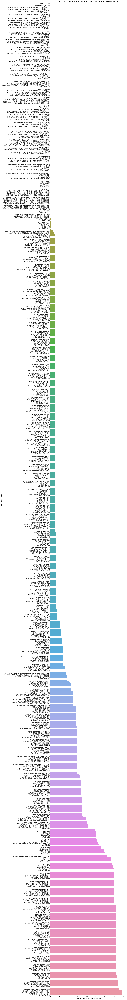

In [14]:
DataNaN = train_data.isna().sum().divide(train_data.shape[0]).multiply(100).sort_values(ascending = True)
    
plt.figure(figsize=(15, 200))
sns.barplot(x = DataNaN.values, y = DataNaN.index)
plt.xlabel('Taux de données manquante (en %)', fontsize = 15)
plt.ylabel('Nom de la variable', fontsize = 15)
plt.title('Taux de données manquantes par variable dans le dataset (en %)', fontsize = 20)
plt.tick_params(axis='x', which='major', labelsize=15)
plt.tick_params(axis='y', which='major', labelsize=10)
plt.show()

Pour la suite nous ne garderons que les variables avec moins de 60% de valeurs manquantes, au dessus nous n'aurons pas assez de valeurs pour avoir des valeurs de moyenne ou médiane qui colle vraiment à ce que nous avons et ça n'apportera pas d'infos au final.

In [15]:
def tauxDeNan_Affichage(dataset, variable):
    print('La variable', variable, 'contient', round((dataset[variable].isna().sum()/dataset.shape[0]) * 100, 2), '% de données manquantes.')


def tauxDeNan(dataset, variable):
    return round((dataset[variable].isna().sum()/dataset.shape[0])*100, 2)

In [16]:
listeVariableADrop = []

In [17]:
for variable in train_data.columns:
    if tauxDeNan(train_data, variable) > 60:
        listeVariableADrop.append(variable)

In [18]:
len(listeVariableADrop)

158

In [19]:
train_data.drop(listeVariableADrop, axis = 1, inplace = True)

In [20]:
train_data.head(5)

,CNT_INSTALMENT_MEAN_YEAR_0_MAX,CNT_PAYMENT_MEAN_ALL,BUREAU_AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL_INCOME_RATIO,EXT_SOURCE_MEAN_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,PRODUCT_COMBINATION_MEAN_ALL,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,INTEREST_DOWNPAYMENT_MEAN_LAST_5,AMT_ANNUITY_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,TOTAL_TERM_MAX_YEAR_0_MEAN,APARTMENTS_SUM_MEDI_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_DIFF_MIN_LAST_1_YEAR,HOUR_APPR_PROCESS_START_MEAN_LAST_5,AMT_REQ_CREDIT_BUREAU_MON,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,MISSING_VALS_TOTAL_APP,DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE,BUREAU_DAYS_CREDIT_MEAN_OVERALL_REGISTRATION_DIFF,NAME_PRODUCT_TYPE_MEAN_ALL,TOTAL_TERM_LAST_MEAN,EXT_SOURCE_MEAN_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_SUM_LAST_5,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,APARTMENTS_AVG,ENTRANCES_AVG,DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED,EXP_CNT_INSTALMENT_LAST_YEAR_0_MEAN,AGE_EMPLOYED_DIFF_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,FLOORSMAX_MODE,CNT_INSTALMENT_FUTURE_MAX_ACTIVE_MEAN,EXT_SOURCE_3_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,DEF_30_CREDIT_RATIO,TOTAL_TERM_MEAN_YEAR_0_MAX,INTEREST_DOWNPAYMENT_MAX_ALL,WEEKDAY_APPR_PROCESS_START_MEAN_ALL,INTEREST_SHARE_MAX_ALL,FLAG_DOCUMENT_17,TOTAL_TERM_MAX_YEAR_1_MEAN,NAME_TYPE_SUITE_LAST_FIRST_2,CHANNEL_TYPE_MEAN_ALL,SK_DPD_MAX_YEAR_0_MEAN,EXP_DAYS_PAYMENT_DIFF_LAST_LAST_1_YEAR,AMT_CREDIT_GOODS_DIFF_MEAN_LAST_5,AMT_PAYMENT_MEAN_FIRST_5_INSTALLMENTS,SELLERPLACE_AREA_MIN_LAST_5,EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,RATE_DOWN_PAYMENT_MAX_FIRST_2,GOOD_DOWNPAYMET_RATIO_MAX_FIRST_2,NAME_CONTRACT_TYPE_MEAN_ALL,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXT_SOURCE_2_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,CNT_INSTALMENT_MAX_YEAR_0_MEAN,CNT_INSTALMENT_FUTURE_MIN_MEAN,CNT_INSTALMENT_MEAN_YEAR_0_SUM,HOUR_APPR_PROCESS_START_MEAN_FIRST_2,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_CLOSED_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,PREV_AMT_GOODS_PRICE_SUM_ALL_INCOME_RATIO,APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,OCCUPATION_TYPE_1,HOUR_APPR_PROCESS_START_MAX_ALL,PREV_AMT_ANNUITY_MAX_ALL_INCOME_RATIO,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,FLAG_DOCUMENT_6,OBS_DEF_30_MUL,AMT_ANNUITY_MEAN_ALL,SELLERPLACE_AREA_MEAN_LAST_5,ANNUITY_INCOME_RATIO_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,DAYS_FIRST_DUE_MAX_ALL,EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,FLAG_DOCUMENT_18,DAYS_DECISION_MIN_LAST_5,INTEREST_SHARE_MAX_LAST_5,AMT_CREDIT_SUM_LIMIT_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_YIELD_GROUP_SUM_LAST_5,INCOME_ANNUITY_DIFF,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_SUM_MAX_RATIO,EXT_SOURCE_MEAN_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,EXT_SOURCE_2_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_ANNUITY_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,NUM_INSTALMENT_VERSION_MEAN_MEAN,NAME_CONTRACT_STATUS_MEAN_LAST_5,NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2,INTEREST_SHARE_MIN_ALL,MISSING_VALUES_TOTAL_PREV_SUM_ALL,CNT_INSTALMENT_MIN_ACTIVE_MEAN,CODE_REJECT_REASON_MEAN_ALL,ANNUITY_GOODS_MAX_FIRST_2,DAYS_PAYMENT_RATIO_MAX_MAX,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUR_PROCESS_CREDIT_MUL,DAYS_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,CNT_INSTALMENT_MIN_YEAR_0_MEAN,CNT_INSTALMENT_FUTURE_MAX_YEAR_REST_MEAN,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_INTEREST_MEAN_ALL,PREV_AMT_GOODS_PRICE_MAX_LAST_5_INCOME_RATIO,FLAG_LAST_APPL_PER_CONTRACT_SUM_ALL,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_CREDIT_SUM_SUM_CREDITACTI

Enlevons ces mêmes variables à test_data, afin que nous puissions utiliser la table par la suite (afin qu'il n'y ait pas de problème de nombre de variable):  

In [21]:
test_data.drop(listeVariableADrop, axis = 1, inplace = True)

In [22]:
test_data.shape

(48744, 954)

Nous allons maintenant regarder les outliers, en fonction de ça nous appliquerons soit la moyenne, soit la médianne en remplacement des valeurs manquantes.

In [23]:
for column in train_data.columns:
    if train_data[column].dtypes == 'int8' or train_data[column].dtypes == 'int16' or train_data[column].dtypes == 'int32':
        train_data[column] = train_data[column].astype('int64')
    elif train_data[column].dtypes == 'float16' or train_data[column].dtypes == 'float32':
        train_data[column] = train_data[column].astype('float64')

In [24]:
train_data['SK_ID_CURR'] = train_data['SK_ID_CURR'].astype('object')
#train_data['CNT_CHILDREN'] = train_data['CNT_CHILDREN'].astype('object')

In [25]:
colonneNumériqueTrain = train_data.select_dtypes(['int64','float64']).columns
colonneNumériqueTest = test_data.select_dtypes(['int64','float64']).columns

In [26]:
listeVariableAvecNaN = []

In [27]:
for variable in train_data[colonneNumériqueTrain].columns:
    if tauxDeNan(train_data, variable) > 0:
        listeVariableAvecNaN.append(variable)

In [28]:
len(listeVariableAvecNaN)

743

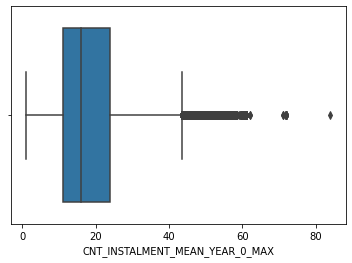

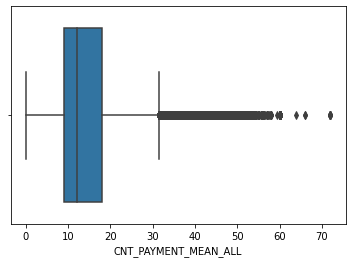

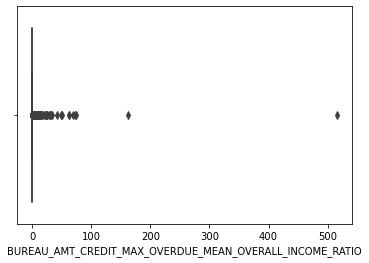

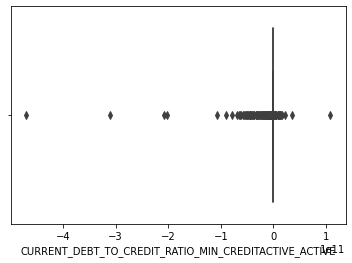

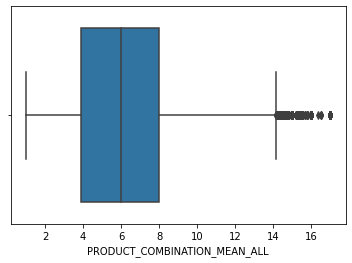

...

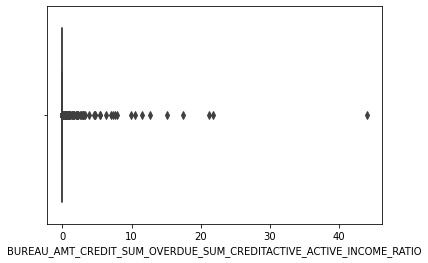

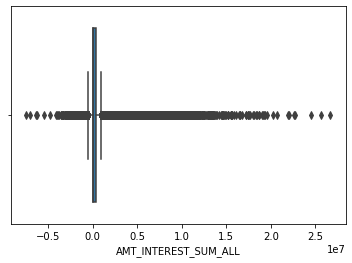

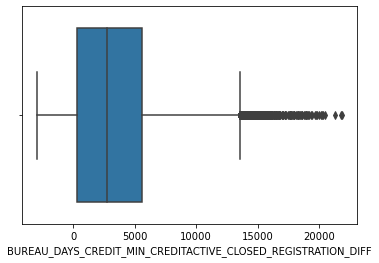

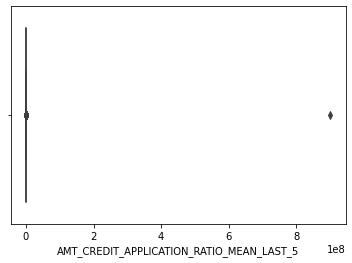

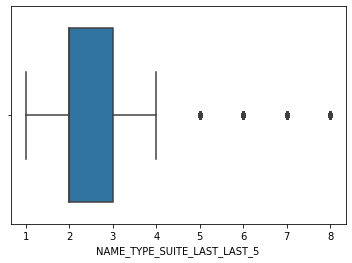

In [29]:
for variable in listeVariableAvecNaN:
    sns.boxplot(x = train_data[variable])
    plt.show()

Pour les variables qui possédant des outliers nous utiliserons la médiane comme remplacement des valeurs manquantes, pour les autres variables nous utiliserons la moyenne.

Il existe des moyens automatique pour la recherche des oultiers, comme l'intervalle inter-quartile notamment, mais pour être sûr du résultat, j'ai préféré regarder moi même les boxplots.

In [30]:
listeVariableMoyenne = ['NAME_YIELD_GROUP_MEAN_LAST_5', 'NAME_YIELD_GROUP_MEAN_FIRST_2', 'WEEKDAY_APPR_PROCESS_START_MEAN_ALL', 'DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED', 'CREDIT_TYPE_Consumer credit_MEAN_OVERALL', 'INTEREST_SHARE_MIN_LAST_5', 'CREDIT_ACTIVE_Closed_MEAN_OVERALL', 'NAME_CONTRACT_STATUS_MAX_LAST_5', 'DAYS_LAST_DUE_1ST_VERSION_MEAN_FIRST_2', 'NAME_YIELD_GROUP_MEAN_ALL', 'NAME_CLIENT_TYPE_MEAN_LAST_5', 'INTEREST_RATE_MIN_ALL', 'INTEREST_SHARE_MIN_ALL', 'DAYS_DECISION_MIN_LAST_5', 'WEEKDAY_APPR_PROCESS_START_MAX_LAST_5', 'DAYS_DECISION_MIN_FIRST_2', 'PRODUCT_COMBINATION_LAST_LAST_5', 'DAYS_LAST_DUE_MEAN_FIRST_2', 'NAME_CLIENT_TYPE_MEAN_ALL', 'DAYS_DECISION_MIN_ALL', 'DAYS_DECISION_MEAN_FIRST_2', 'NAME_PRODUCT_TYPE_LAST_FIRST_2', 'DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED', 'DAYS_FIRST_DUE_MEAN_FIRST_2', 'NAME_YIELD_GROUP_LAST_FIRST_2', 'DAYS_FIRST_DUE_MAX_FIRST_2', 'WEEKDAY_APPR_PROCESS_START_MIN_LAST_5', 'DAYS_TERMINATION_MEAN_FIRST_2',  'INTEREST_RATE_MIN_LAST_5', 'DAYS_CREDIT_MIN_CREDITACTIVE_CLOSED', 'DAYS_DECISION_MAX_FIRST_2',  'CREDIT_ACTIVE_Active_MEAN_OVERALL', 'DAYS_TERMINATION_MAX_FIRST_2', 'MISSING_VALUES_TOTAL_PREV_SUM_LAST_5', 'NAME_CONTRACT_STATUS_LAST_LAST_5', 'WEEKDAY_APPR_PROCESS_START_MEAN_LAST_5', 'NAME_PORTFOLIO_LAST_LAST_5',  'NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2', 'PRODUCT_COMBINATION_LAST_FIRST_2', 'WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2', 'NAME_CONTRACT_STATUS_MEAN_LAST_5', 'NAME_YIELD_GROUP_LAST_LAST_5', 'WEEKDAY_APPR_PROCESS_START_MEAN_FIRST_2']

In [31]:
listeVariableTrainData = train_data[colonneNumériqueTrain].columns.tolist()

In [32]:
len(listeVariableTrainData)

944

In [33]:
listeVariableMédianne = listeVariableTrainData
for elt in listeVariableMoyenne:
    if elt in listeVariableMédianne:
        listeVariableMédianne.remove(elt)
    else:
        continue

In [34]:
for variable in listeVariableMoyenne:
    train_data[variable].fillna(value = train_data[variable].mean(), inplace=True) 

In [35]:
for variable in listeVariableMédianne:
    train_data[variable].fillna(value = train_data[variable].median(), inplace=True) 

In [36]:
train_data.head(5)

,CNT_INSTALMENT_MEAN_YEAR_0_MAX,CNT_PAYMENT_MEAN_ALL,BUREAU_AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL_INCOME_RATIO,EXT_SOURCE_MEAN_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,PRODUCT_COMBINATION_MEAN_ALL,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,INTEREST_DOWNPAYMENT_MEAN_LAST_5,AMT_ANNUITY_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,TOTAL_TERM_MAX_YEAR_0_MEAN,APARTMENTS_SUM_MEDI_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_DIFF_MIN_LAST_1_YEAR,HOUR_APPR_PROCESS_START_MEAN_LAST_5,AMT_REQ_CREDIT_BUREAU_MON,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,MISSING_VALS_TOTAL_APP,DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE,BUREAU_DAYS_CREDIT_MEAN_OVERALL_REGISTRATION_DIFF,NAME_PRODUCT_TYPE_MEAN_ALL,TOTAL_TERM_LAST_MEAN,EXT_SOURCE_MEAN_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_SUM_LAST_5,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,APARTMENTS_AVG,ENTRANCES_AVG,DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED,EXP_CNT_INSTALMENT_LAST_YEAR_0_MEAN,AGE_EMPLOYED_DIFF_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,FLOORSMAX_MODE,CNT_INSTALMENT_FUTURE_MAX_ACTIVE_MEAN,EXT_SOURCE_3_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,DEF_30_CREDIT_RATIO,TOTAL_TERM_MEAN_YEAR_0_MAX,INTEREST_DOWNPAYMENT_MAX_ALL,WEEKDAY_APPR_PROCESS_START_MEAN_ALL,INTEREST_SHARE_MAX_ALL,FLAG_DOCUMENT_17,TOTAL_TERM_MAX_YEAR_1_MEAN,NAME_TYPE_SUITE_LAST_FIRST_2,CHANNEL_TYPE_MEAN_ALL,SK_DPD_MAX_YEAR_0_MEAN,EXP_DAYS_PAYMENT_DIFF_LAST_LAST_1_YEAR,AMT_CREDIT_GOODS_DIFF_MEAN_LAST_5,AMT_PAYMENT_MEAN_FIRST_5_INSTALLMENTS,SELLERPLACE_AREA_MIN_LAST_5,EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,RATE_DOWN_PAYMENT_MAX_FIRST_2,GOOD_DOWNPAYMET_RATIO_MAX_FIRST_2,NAME_CONTRACT_TYPE_MEAN_ALL,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXT_SOURCE_2_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,CNT_INSTALMENT_MAX_YEAR_0_MEAN,CNT_INSTALMENT_FUTURE_MIN_MEAN,CNT_INSTALMENT_MEAN_YEAR_0_SUM,HOUR_APPR_PROCESS_START_MEAN_FIRST_2,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_CLOSED_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,PREV_AMT_GOODS_PRICE_SUM_ALL_INCOME_RATIO,APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,OCCUPATION_TYPE_1,HOUR_APPR_PROCESS_START_MAX_ALL,PREV_AMT_ANNUITY_MAX_ALL_INCOME_RATIO,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,FLAG_DOCUMENT_6,OBS_DEF_30_MUL,AMT_ANNUITY_MEAN_ALL,SELLERPLACE_AREA_MEAN_LAST_5,ANNUITY_INCOME_RATIO_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,DAYS_FIRST_DUE_MAX_ALL,EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,FLAG_DOCUMENT_18,DAYS_DECISION_MIN_LAST_5,INTEREST_SHARE_MAX_LAST_5,AMT_CREDIT_SUM_LIMIT_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_YIELD_GROUP_SUM_LAST_5,INCOME_ANNUITY_DIFF,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_SUM_MAX_RATIO,EXT_SOURCE_MEAN_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,EXT_SOURCE_2_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_ANNUITY_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,NUM_INSTALMENT_VERSION_MEAN_MEAN,NAME_CONTRACT_STATUS_MEAN_LAST_5,NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2,INTEREST_SHARE_MIN_ALL,MISSING_VALUES_TOTAL_PREV_SUM_ALL,CNT_INSTALMENT_MIN_ACTIVE_MEAN,CODE_REJECT_REASON_MEAN_ALL,ANNUITY_GOODS_MAX_FIRST_2,DAYS_PAYMENT_RATIO_MAX_MAX,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUR_PROCESS_CREDIT_MUL,DAYS_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,CNT_INSTALMENT_MIN_YEAR_0_MEAN,CNT_INSTALMENT_FUTURE_MAX_YEAR_REST_MEAN,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_INTEREST_MEAN_ALL,PREV_AMT_GOODS_PRICE_MAX_LAST_5_INCOME_RATIO,FLAG_LAST_APPL_PER_CONTRACT_SUM_ALL,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_CREDIT_SUM_SUM_CREDITACTI

In [37]:
train_dataWNaN = train_data.copy()
joblib.dump(train_dataWNaN, r'C:\Users\Alexis\train_dataWNaN.joblib')

['C:\\Users\\Alexis\\train_dataWNaN.joblib']

In [38]:
cntchildrendf = train_data[['SK_ID_CURR', 'CNT_CHILDREN']]
amtincometotaldf = train_data[['SK_ID_CURR', 'AMT_INCOME_TOTAL']]
amtcreditdf = train_data[['SK_ID_CURR', 'AMT_CREDIT']]
amtannuity = train_data[['SK_ID_CURR', 'AMT_ANNUITY']]

Nous pouvons maintenant standardiser nos valeurs:

In [39]:
std = StandardScaler()
train_data[colonneNumériqueTrain] = std.fit_transform(train_data[colonneNumériqueTrain])

In [40]:
train_data.head(5)

,CNT_INSTALMENT_MEAN_YEAR_0_MAX,CNT_PAYMENT_MEAN_ALL,BUREAU_AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL_INCOME_RATIO,EXT_SOURCE_MEAN_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,PRODUCT_COMBINATION_MEAN_ALL,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,INTEREST_DOWNPAYMENT_MEAN_LAST_5,AMT_ANNUITY_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,TOTAL_TERM_MAX_YEAR_0_MEAN,APARTMENTS_SUM_MEDI_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_DIFF_MIN_LAST_1_YEAR,HOUR_APPR_PROCESS_START_MEAN_LAST_5,AMT_REQ_CREDIT_BUREAU_MON,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,MISSING_VALS_TOTAL_APP,DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE,BUREAU_DAYS_CREDIT_MEAN_OVERALL_REGISTRATION_DIFF,NAME_PRODUCT_TYPE_MEAN_ALL,TOTAL_TERM_LAST_MEAN,EXT_SOURCE_MEAN_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_SUM_LAST_5,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,APARTMENTS_AVG,ENTRANCES_AVG,DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED,EXP_CNT_INSTALMENT_LAST_YEAR_0_MEAN,AGE_EMPLOYED_DIFF_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,FLOORSMAX_MODE,CNT_INSTALMENT_FUTURE_MAX_ACTIVE_MEAN,EXT_SOURCE_3_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,DEF_30_CREDIT_RATIO,TOTAL_TERM_MEAN_YEAR_0_MAX,INTEREST_DOWNPAYMENT_MAX_ALL,WEEKDAY_APPR_PROCESS_START_MEAN_ALL,INTEREST_SHARE_MAX_ALL,FLAG_DOCUMENT_17,TOTAL_TERM_MAX_YEAR_1_MEAN,NAME_TYPE_SUITE_LAST_FIRST_2,CHANNEL_TYPE_MEAN_ALL,SK_DPD_MAX_YEAR_0_MEAN,EXP_DAYS_PAYMENT_DIFF_LAST_LAST_1_YEAR,AMT_CREDIT_GOODS_DIFF_MEAN_LAST_5,AMT_PAYMENT_MEAN_FIRST_5_INSTALLMENTS,SELLERPLACE_AREA_MIN_LAST_5,EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,RATE_DOWN_PAYMENT_MAX_FIRST_2,GOOD_DOWNPAYMET_RATIO_MAX_FIRST_2,NAME_CONTRACT_TYPE_MEAN_ALL,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXT_SOURCE_2_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,CNT_INSTALMENT_MAX_YEAR_0_MEAN,CNT_INSTALMENT_FUTURE_MIN_MEAN,CNT_INSTALMENT_MEAN_YEAR_0_SUM,HOUR_APPR_PROCESS_START_MEAN_FIRST_2,BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_CLOSED_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,PREV_AMT_GOODS_PRICE_SUM_ALL_INCOME_RATIO,APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,OCCUPATION_TYPE_1,HOUR_APPR_PROCESS_START_MAX_ALL,PREV_AMT_ANNUITY_MAX_ALL_INCOME_RATIO,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,FLAG_DOCUMENT_6,OBS_DEF_30_MUL,AMT_ANNUITY_MEAN_ALL,SELLERPLACE_AREA_MEAN_LAST_5,ANNUITY_INCOME_RATIO_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,DAYS_FIRST_DUE_MAX_ALL,EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,FLAG_DOCUMENT_18,DAYS_DECISION_MIN_LAST_5,INTEREST_SHARE_MAX_LAST_5,AMT_CREDIT_SUM_LIMIT_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_YIELD_GROUP_SUM_LAST_5,INCOME_ANNUITY_DIFF,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_SUM_MAX_RATIO,EXT_SOURCE_MEAN_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,EXT_SOURCE_2_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_ANNUITY_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,NUM_INSTALMENT_VERSION_MEAN_MEAN,NAME_CONTRACT_STATUS_MEAN_LAST_5,NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2,INTEREST_SHARE_MIN_ALL,MISSING_VALUES_TOTAL_PREV_SUM_ALL,CNT_INSTALMENT_MIN_ACTIVE_MEAN,CODE_REJECT_REASON_MEAN_ALL,ANNUITY_GOODS_MAX_FIRST_2,DAYS_PAYMENT_RATIO_MAX_MAX,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUR_PROCESS_CREDIT_MUL,DAYS_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,CNT_INSTALMENT_MIN_YEAR_0_MEAN,CNT_INSTALMENT_FUTURE_MAX_YEAR_REST_MEAN,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_INTEREST_MEAN_ALL,PREV_AMT_GOODS_PRICE_MAX_LAST_5_INCOME_RATIO,FLAG_LAST_APPL_PER_CONTRACT_SUM_ALL,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_CREDIT_SUM_SUM_CREDITACTI

Nous allons dans un premier temps essayer d'entraîner les modèles et de les optimiser avec GridSearchCV, ensuite nous essayerons d'optimiser les modèles avec HyperOpt.

Nous allons nous intéresser à 3 modèles basés sur les arbres de décision, nous avons vu dans un projet précèdent que l'on obtenait de meilleurs résultats avec ce type de modèle (Mais il faut rester vigilant tout de même au type de données  que l'on a).

Les modèles qui seront utilisés ici seront Random Forest, XGBoost et LightGBM.

Avant d'optimiser les modèles nous allons regarder ce que nous obtenons avec les paramètres par défaut de chaque modèle, afin de voir s'il y a une amélioration ou non par la suite.

Dans un premier temps crééons nos jeu d'entrainment et de test:

In [41]:
X_train, X_test, y_train, y_test = train_test_split(train_data, target_train['TARGET'], test_size=0.30, random_state=SEED)

In [42]:
X_train.shape

(215254, 954)

In [43]:
dataframeInfoXTrain = X_train[['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'CODE_GENDER', 'NAME_FAMILY_STATUS', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_EDUCATION_TYPE', 'ORGANIZATION_TYPE']]
dataframeInfoXTest = X_test[['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'CODE_GENDER', 'NAME_FAMILY_STATUS', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_EDUCATION_TYPE', 'ORGANIZATION_TYPE']]

In [44]:
dataframeInfoXTrain.head(5)

,SK_ID_CURR,NAME_CONTRACT_TYPE,OCCUPATION_TYPE,NAME_INCOME_TYPE,CODE_GENDER,NAME_FAMILY_STATUS,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_EDUCATION_TYPE,ORGANIZATION_TYPE
12276,114315,Cash loans,Secretaries,Commercial associate,F,Single / not married,N,N,Higher education,Trade: type 7
36849,142678,Cash loans,Sales staff,Working,F,Married,Y,Y,Higher education,Trade: type 3
189321,319503,Cash loans,Managers,Working,M,Married,Y,Y,Higher education,Business Entity Type 3
157656,282750,Cash loans,NaN,Pensioner,F,Married,N,Y,Secondary / secondary special,XNA
41740,148331,Cash loans,Security staff,Working,M,Civil marriage,N,Y,Higher education,Police


In [45]:
dataframeInfoXTrain['CNT_CHILDREN'] = cntchildrendf['CNT_CHILDREN']
dataframeInfoXTest['CNT_CHILDREN'] = cntchildrendf['CNT_CHILDREN']

dataframeInfoXTrain['AMT_INCOME_TOTAL'] = amtincometotaldf['AMT_INCOME_TOTAL']
dataframeInfoXTest['AMT_INCOME_TOTAL'] = amtincometotaldf['AMT_INCOME_TOTAL']

dataframeInfoXTrain['AMT_CREDIT'] = amtcreditdf['AMT_CREDIT']
dataframeInfoXTest['AMT_CREDIT'] = amtcreditdf['AMT_CREDIT']

dataframeInfoXTrain['AMT_ANNUITY'] = amtannuity['AMT_ANNUITY']
dataframeInfoXTest['AMT_ANNUITY'] = amtannuity['AMT_ANNUITY']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [46]:
listeVariableASupprimer1 = ['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'OCCUPATION_TYPE', 'NAME_INCOME_TYPE', 'CODE_GENDER', 'NAME_FAMILY_STATUS', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_EDUCATION_TYPE', 'ORGANIZATION_TYPE']

In [47]:
X_train.drop(listeVariableASupprimer1, axis = 1, inplace = True)
X_test.drop(listeVariableASupprimer1, axis = 1, inplace = True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [48]:
stratified_kfold = StratifiedKFold(n_splits = 5, shuffle = True, random_state = SEED)

Nous allons enregistrer les différentes données qui nous servirons pour la suite du projet:

In [49]:
#joblib.dump(dataframeInfoXTrain, r'C:\Users\Alexis\dataframeInfoXTrain.joblib')
#joblib.dump(dataframeInfoXTest, r'C:\Users\Alexis\dataframeInfoXTest.joblib')

#joblib.dump(y_test, r'C:\Users\Alexis\y_test2.joblib')
#joblib.dump(X_test, r'C:\Users\Alexis\X_test2.joblib')
#joblib.dump(y_train, r'C:\Users\Alexis\y_train2.joblib')
#joblib.dump(X_train, r'C:\Users\Alexis\X_train2.joblib')

#joblib.dump(test_data, r'C:\Users\Alexis\test_data2.joblib')
#joblib.dump(train_data, r'C:\Users\Alexis\train_data2.joblib')

Nous allons enregistrer le dataset X_test avec moins d'individus, cela nous servira notamment pour l'exemple en ligne des différents programme (API et Dashboard):

In [50]:
X_test1500 = X_test[0:1500].copy()

In [51]:
joblib.dump(X_test1500, r'C:\Users\Alexis\X_test1500.joblib')

['C:\\Users\\Alexis\\X_test1500.joblib']

### Random Forest

In [52]:
clf = RandomForestClassifier(random_state = SEED)

In [53]:
clf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [54]:
#clf.fit(X_train, y_train)

Maintenant que notre modèle est entrainé, nous allons regarder quelques informations sur ce dernier, ils nous permettront de faire un choix pour un modèle entre tous les modèles entrainés.

Pour ça nous allons créer une fonction qui nous donnera ces différentes informations.

En plus de la valeur AUC, nous afficherons égalment les scores de Rappel et de Précision. Pous nous aider nous allons créer 3 fonctions:

Le score de rappel est le rapport tp / (tp + fn) où tp est le nombre de vrais positifs et fn le nombre de faux négatifs. Le rappel est intuitivement la capacité du classificateur à trouver tous les échantillons positifs.

La score de précision est le rapport tp / (tp + fp) où tp est le nombre de vrais positifs et fp le nombre de faux positifs. La précision est intuitivement la capacité du classificateur à ne pas étiqueter comme positif un échantillon négatif.

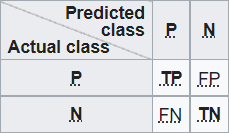

Pour la suite nous prendrons 0 pour signifier que le crédit sera donné car remboursé par le client et 1 pour signifier que le crédit ne sera pas donné car il y aura une probabilité qu'il ne soit pas remboursé.

Nous pouvons également mesurer la mesure F (Fbeta_score), la mesure Fbeta est la moyenne harmonique pondérée entre précision et rappel:

    F0.5-Measure (beta=0.5): More weight on precision, less weight on recall.
    F1-Measure (beta=1.0): Balance the weight on precision and recall.
    F2-Measure (beta=2.0): Less weight on precision, more weight on recall

En plus de la fonction Fbeta_score de Sklearn, nous allons utiliser les formules existantes, la plus courante est la formule 1 mais la 2 existe aussi.

Première formule:

    fb = (1 + beta_squared) x precision x recall / (beta_squared x precision + recall + epsilon)

Deuxième formule:

    Fb = 1/(beta x (1/precision)+(1-beta) x (1/recall))

In [55]:
def mesureF1(beta, precision, recall, epsilon):
    beta_squared = beta**2   
    formule1 = (1 + beta_squared)*(precision*recall / (beta_squared*precision + recall + epsilon))        
    formule2 = 1/(beta*(1/precision)+(1-beta)*(1/recall))
    return formule1, formule2

In [56]:
def informationModele(X_test, y_test, modeleEntraine, nomModele = 'defaut'):
    testScore = modeleEntraine.score(X_test, y_test)
    print('Test Score: ', testScore)
    
    y_pred = modeleEntraine.predict(X_test)
    joblib.dump(y_pred, r'C:\Users\Alexis\y_pred_'+ nomModele + '.joblib')
    print('y_pred: ', y_pred)
    
    print("Confusion Matrix of CV data:")
    #conf_mat = confusion_matrix(y_test, y_pred)
    #tp, fn, fp, tn = confusion_matrix(y_test, y_pred, labels=[1,0]).ravel()
    tp, fp, fn, tn = confusion_matrix(y_test, y_pred).ravel()
    conf_mat = [[tp, fp],
                [fn, tn]]
    print(conf_mat)
    conf_mat = pd.DataFrame(conf_mat, columns = ['0','1'], index = ['0','1'])
    plt.figure(figsize = (7,6))
    plt.title('Confusion Matrix Heatmap')
    sns.heatmap(conf_mat, annot = True, fmt = 'g', linewidth = 0.5, annot_kws = {'size' : 15})
    plt.show()
    
    print("MSE : ", mean_squared_error(y_test, y_pred))
    print("RMSE : ", math.sqrt(mean_squared_error(y_test, y_pred)))
    
    y_predProba = modeleEntraine.predict_proba(X_test)[::,1]
    joblib.dump(y_predProba, r'C:\Users\Alexis\y_predProba_'+ nomModele + '.joblib')

    auc_xg = roc_auc_score(y_test, y_predProba)
    fpr_xg, tpr_xg, thresholds_xg = roc_curve(y_test, y_predProba)
    plt.figure(figsize=(12, 7))
    plt.plot(fpr_xg, tpr_xg, label=f'AUC (xgboost) = {auc_xg:.2f}')
    plt.plot([0, 1], [0, 1], color='blue', linestyle='--', label='Baseline')
    plt.title('ROC Curve', size=20)
    plt.xlabel('False Positive Rate', size=14)
    plt.ylabel('True Positive Rate', size=14)
    plt.legend();
    
    print("Score de Rappel:", recall_score(y_test, y_pred))
    print("Score de Precision:", precision_score(y_test, y_pred))    
    
    print("\nFBeta_Score:")
    mesureF = fbeta_score(y_test, y_pred, beta = 1)
    mesureF05 = fbeta_score(y_test, y_pred, beta = 0.5)
    mesureF2 = fbeta_score(y_test, y_pred, beta = 2)
    print("Mesure F:", mesureF)
    print("Mesure F05:", mesureF05)
    print("Mesure F2:", mesureF2)

In [57]:
#informationModele(X_test, y_test, clf, 'clf')

### XGBoost

In [58]:
xgb = XGBClassifier(random_state = SEED)

In [59]:
xgb.fit(X_train, y_train)

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[16:08:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

Test Score:  0.9196015305735314
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84310, 564], [6853, 526]]


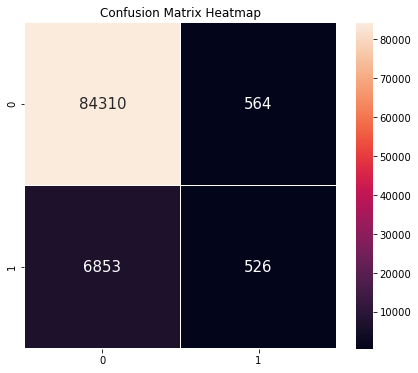

MSE :  0.08039846942646851
RMSE :  0.2835462386039859
Score de Rappel: 0.0712833717305868
Score de Precision: 0.48256880733944957

FBeta_Score:
Mesure F: 0.12421773526980753
Mesure F05: 0.2240395263651077
Mesure F2: 0.08593086322943212


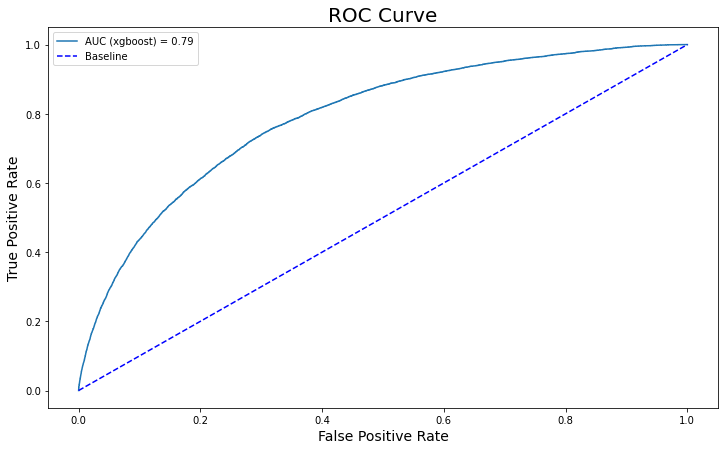

In [60]:
informationModele(X_test, y_test, xgb, 'xgb')

### LightGBM

In [61]:
lgbm = LGBMClassifier(random_state = SEED)

In [62]:
lgbm.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [63]:
lgbm.fit(X_train, y_train)

LGBMClassifier()

Test Score:  0.9209023012801751
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84624, 250], [7047, 332]]


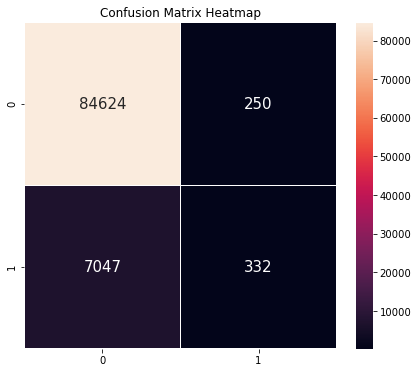

MSE :  0.07909769871982483
RMSE :  0.28124313097358455
Score de Rappel: 0.04499254641550345
Score de Precision: 0.570446735395189

FBeta_Score:
Mesure F: 0.08340660721014947
Mesure F05: 0.17101061089935093
Mesure F2: 0.05515316632334372


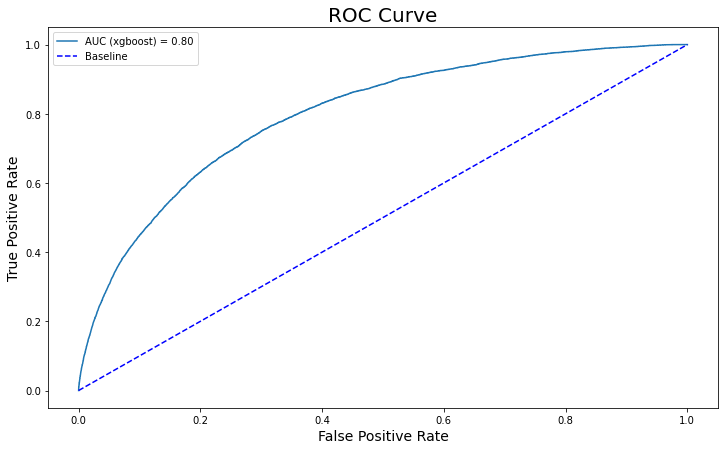

In [64]:
informationModele(X_test, y_test, lgbm, 'lgbm')

Nous allons donc essayer d'améliorer ces résultats.

## Optimisation avec GridSearchCV

### Random Forest

Pour une question de temps nous rechercherons les meilleurs hyperparamètres une fois avec 5000 lignes et ensuite nous entraînerons le dataset entier avec ces hyperparamètres, ce ne sera pas optimal malheureusement.

In [66]:
X_train5000 = X_train[0:5000]

In [67]:
y_train5000 = y_train[0:5000]

Pour la suite nous allons récupérer la meilleure valeur des différents hyperparamètres, pour éviter par la suite de devoir entrainer de nouveau le modèle. 

In [68]:
#param_rfr = {'n_estimators' : [500, 800, 1200, 1500],
#             'max_depth' : [15, 20, 25, 30, None],            
#             'max_features': ['auto', 'sqrt', 'log2'],
#             'min_samples_leaf': [5, 10, 15, 20, 25],
#             'min_samples_split': [5, 10, 15, 20, 25]}
#
#gs_randomForestClassifier = GridSearchCV(RandomForestClassifier(),
#                 param_grid = param_rfr,            
#                  verbose = 2,
#                  cv = cv_train,
#                  scoring='roc_auc', 
#                  refit='roc_auc',
#                  return_train_score = True,                  
#                  n_jobs = -1
#                 )
#
#
#gs_randomForestClassifier.fit(X_train5000, y_train5000)

In [69]:
# print('Nous avons les meilleurs résultats avec les paramètres: \n', gs_randomForestClassifier.best_params_)
# {'max_depth': 25, 'max_features': 'auto', 'min_samples_leaf': 25, 'min_samples_split': 20, 'n_estimators': 1200}

In [70]:
rfc = RandomForestClassifier(max_depth = 25, max_features = 'auto', n_estimators = 1200, min_samples_leaf = 25, min_samples_split = 20, random_state = SEED)

In [71]:
#rfc.fit(X_train, y_train)

In [72]:
#informationModele(X_test, y_test, rfc, 'rfc')

### XGBoost

In [73]:
#param_xgb = {'max_depth' : [5, 10],
#              'min_child_weight' : [75, 80],
#              'gamma' : [0.5, 1],
#              'subsample' : [0.5, 1],
#              'colsample_bytree' : [0.5, 1],
#              'colsample_bylevel' : [0.5, 1],
#              'colsample_bynode' : [0.5, 1],
#              'reg_alpha' : [0.1, 0.3],
#              'reg_lambda' : [0.1, 0.3]}
#
#gs_XGBClassifier = GridSearchCV(XGBClassifier(),
#                 param_grid = param_xgb,            
#                  verbose = 2,
#                  cv = cv_train,
#                  scoring='roc_auc', 
#                  refit='roc_auc',
#                  return_train_score = True,                  
#                  n_jobs = -1
#                 )
#
#gs_XGBClassifier.fit(X_train5000, y_train5000)

In [74]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', gs_XGBClassifier.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
# {'colsample_bylevel': 0.5, 'colsample_bynode': 0.5, 'colsample_bytree': 0.5, 'gamma': 0.5, 'max_depth': 5,
#  'min_child_weight': 75, 
#  'reg_alpha': 0.3, 'reg_lambda': 0.3, 'subsample': 1}

In [75]:
xgbGrid = XGBClassifier(colsample_bytree = 0.5, colsample_bynode = 0.5, colsample_bylevel = 0.5, gamma = 0.5, max_depth = 5, min_child_weight = 75, reg_alpha = 0.3, reg_lambda = 0.3, subsample = 1, random_state = SEED)

In [76]:
xgbGrid.fit(X_train, y_train)

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[16:16:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=0.5,
              colsample_bynode=0.5, colsample_bytree=0.5, gamma=0.5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=5,
              min_child_weight=75, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0.3, reg_lambda=0.3, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

Test Score:  0.9209131410360639
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84501, 373], [6923, 456]]


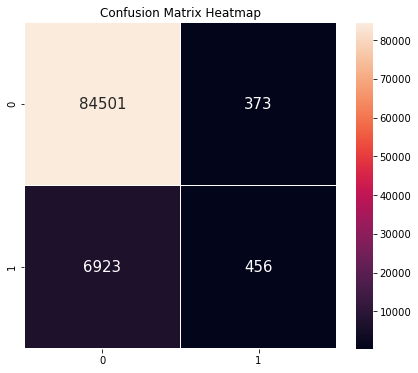

MSE :  0.07908685896393614
RMSE :  0.2812238591654985
Score de Rappel: 0.061796991462257755
Score de Precision: 0.5500603136308806

FBeta_Score:
Mesure F: 0.1111111111111111
Mesure F05: 0.2131837307152875
Mesure F2: 0.07513593672763223


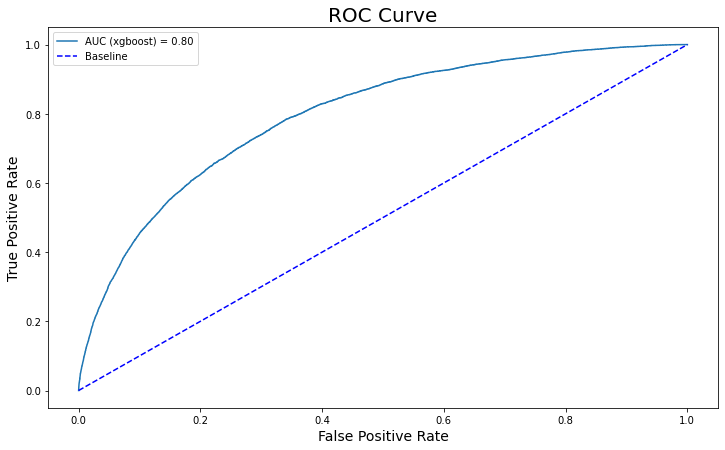

In [77]:
informationModele(X_test, y_test, xgbGrid, 'xgbGrid')

Nous pouvons voir une légère amélioration du score AUC après avoir entraîné le modèle et opter pour les meilleurs Hyperparamètre, mais regardons si nous pouvons encore l'améliorer un peu.

### LightGBM

In [78]:
#param_lgbm = {'num_leaves' : [35, 40, 45],
#              'max_depth' : [5, 10],
#              'min_split_gain' : [0, 0.1],
#              'min_child_weight' : [30, 35],
#              'min_child_samples' : [30, 35],
#              'subsample' : [0.5, 1],
#              'colsample_bytree' : [0.5, 1],
#              'reg_alpha' : [0.1, 0.3],
#              'reg_lambda' : [0.1, 0.3]}
#
#gs_LGBMClassifier = GridSearchCV(LGBMClassifier(),
#                  param_grid = param_lgbm,            
#                  verbose = 2,
#                  cv = cv_train,
#                  scoring='roc_auc', 
#                  refit='roc_auc',
#                  return_train_score = True,                  
#                  n_jobs = -1
#                 )
#
#gs_LGBMClassifier.fit(X_train5000, y_train5000)

In [79]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', gs_LGBMClassifier.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
# {'colsample_bytree': 0.5, 'max_depth': 5, 'min_child_samples': 35, 'min_child_weight': 35, 'min_split_gain': 0, 
#  'num_leaves': 35, 'reg_alpha': 0.1, 'reg_lambda': 0.3, 'subsample': 0.5}

In [80]:
lgbmGrid = LGBMClassifier(colsample_bytree = 0.5, max_depth = 5, min_child_samples = 35, min_child_weight = 35, min_split_gain = 0, num_leaves = 35, reg_alpha = 0.1, reg_lambda = 0.3, subsample = 0.5, random_state = SEED)

In [81]:
lgbmGrid.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.5, max_depth=5, min_child_samples=35,
               min_child_weight=35, min_split_gain=0, num_leaves=35,
               reg_alpha=0.1, reg_lambda=0.3, subsample=0.5)

Test Score:  0.9209348205478413
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84689, 185], [7109, 270]]


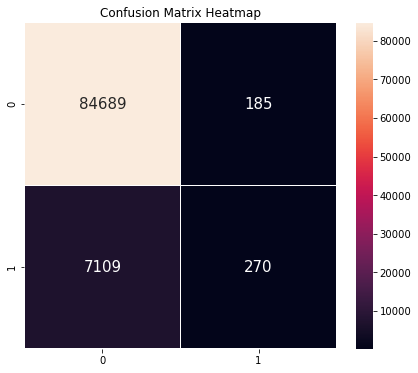

MSE :  0.07906517945215874
RMSE :  0.28118531158678745
Score de Rappel: 0.036590323892126304
Score de Precision: 0.5934065934065934

FBeta_Score:
Mesure F: 0.06893030380393157
Mesure F05: 0.1467550820741385
Mesure F2: 0.045043542090687665


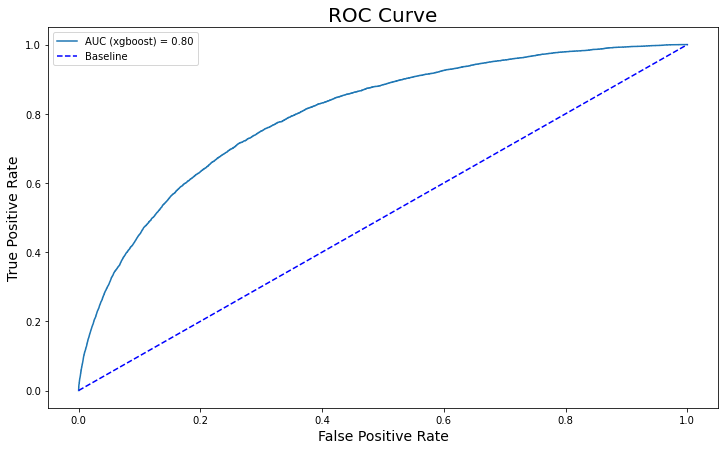

In [82]:
informationModele(X_test, y_test, lgbmGrid, 'lgbmGrid')

## Utilisation de SMOTE

Pour la suite nous allons regarder ce que nous obtenons en utilisant SMOTE (Synthetic Minority Over-Sampling TEchnique) qui est une technique utilisée pour traiter des ensembles de données déséquilibrées.

In [83]:
#!pip install imblearn

In [84]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.under_sampling import RandomUnderSampler

In [85]:
smote = SMOTE(random_state = SEED)

X_train5000SMOTE, y_train5000SMOTE = smote.fit_resample(X_train5000, y_train5000)
X_trainSMOTE, y_trainSMOTE = smote.fit_resample(X_train, y_train)

In [86]:
from collections import Counter
counter = Counter(y_train)
print(counter)
counterSMOTE = Counter(y_trainSMOTE)
print(counterSMOTE)

Counter({0: 197808, 1: 17446})
Counter({0: 197808, 1: 197808})


### Random Forest

In [87]:
#param_rfrSMOTE1 = {'n_estimators' : [800, 1200, 1500],
#             'max_depth' : [15, 20, 25],            
#             'max_features': ['auto', 'sqrt', 'log2'],
#             'min_samples_leaf': [20, 25, 30],
#             'min_samples_split': [15, 20, 25]}
#
#grid_searchRFRSMOTE1 = GridSearchCV(estimator = RandomForestClassifier(),
#                           param_grid = param_rfrSMOTE1,
#                           verbose = 2,
#                           cv = stratified_kfold,
#                           scoring = 'roc_auc',
#                           refit='roc_auc',
#                           return_train_score = True,
#                           n_jobs=-1)
#
#grid_searchRFRSMOTE1.fit(X_train5000SMOTE, y_train5000SMOTE)

In [88]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', grid_searchRFRSMOTE1.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
#{'modelRandomForestSMOTE1__max_depth': 25, 'modelRandomForestSMOTE1__max_features': 'log2', 'modelRandomForestSMOTE1__min_samples_leaf': 20, 'modelRandomForestSMOTE1__min_samples_split': 25, 'modelRandomForestSMOTE1__n_estimators': 1200

In [89]:
grid_searchRFRSMOTE1 = RandomForestClassifier(max_depth = 25, max_features = 'log2', min_samples_leaf = 20, min_samples_split = 25, n_estimators = 1200)

In [90]:
#grid_searchRFRSMOTE1 = grid_searchRFRSMOTE1.fit(X_trainSMOTE, y_trainSMOTE)

In [91]:
#informationModele(X_test, y_test, grid_searchRFRSMOTE1, 'grid_searchRFRSMOTE1')

### XGBoost

In [92]:
#param_xgbSMOTE1 = {'max_depth' : [5, 10],
#              'min_child_weight' : [75, 80],
#              'gamma' : [0.5, 1],
#              'subsample' : [0.5, 1],
#              'colsample_bytree' : [0.5, 1],
#              'colsample_bylevel' : [0.5, 1],
#              'colsample_bynode' : [0.5, 1],
#              'reg_alpha' : [0.1, 0.3],
#              'reg_lambda' : [0.1, 0.3]}
#
#grid_searchXGBSMOTE1 = GridSearchCV(estimator = XGBClassifier(),
#                           param_grid = param_xgbSMOTE1,
#                           verbose = 2,
#                           cv = stratified_kfold,
#                           scoring = 'roc_auc',
#                           refit='roc_auc',
#                           return_train_score = True,
#                           n_jobs=-1)
#
#grid_searchXGBSMOTE1.fit(X_train5000SMOTE, y_train5000SMOTE)

In [93]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', grid_searchXGBSMOTE1.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
#{'modelXGBSMOTE1__colsample_bylevel': 1, 'modelXGBSMOTE1__colsample_bynode': 0.5, 'modelXGBSMOTE1__colsample_bytree': 0.5, 'modelXGBSMOTE1__gamma': 1, 'modelXGBSMOTE1__max_depth': 10, 'modelXGBSMOTE1__min_child_weight': 80, 'modelXGBSMOTE1__reg_alpha': 0.3, 'modelXGBSMOTE1__reg_lambda': 0.3, 'modelXGBSMOTE1__subsample': 1

In [94]:
grid_searchXGBSMOTE1 = XGBClassifier(colsample_bylevel = 0.5, colsample_bynode = 1, colsample_bytree = 0.5, gamma = 0.5, max_depth = 5, min_child_weight = 75, reg_alpha = 0.3, reg_lambda = 0.3, subsample = 1, random_state = SEED)

In [95]:
grid_searchXGBSMOTE1 = grid_searchXGBSMOTE1.fit(X_trainSMOTE, y_trainSMOTE)

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[16:18:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Test Score:  0.9200568003208568
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84368, 506], [6869, 510]]


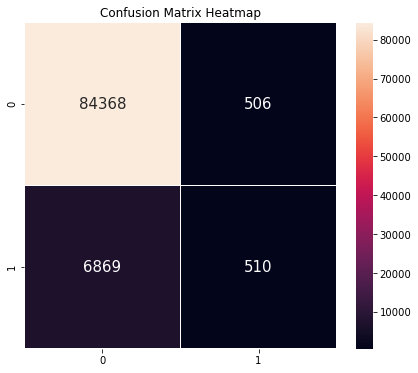

MSE :  0.07994319967914322
RMSE :  0.28274228491533276
Score de Rappel: 0.06911505624068302
Score de Precision: 0.5019685039370079

FBeta_Score:
Mesure F: 0.12150089338892199
Mesure F05: 0.22284365987940224
Mesure F2: 0.08351893095768376


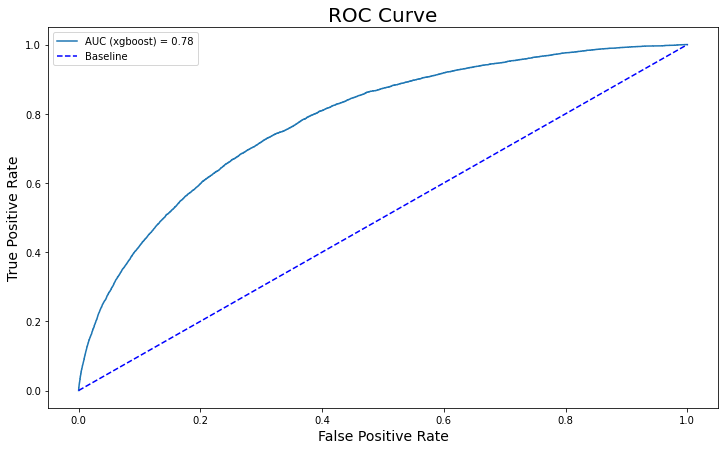

In [96]:
informationModele(X_test, y_test, grid_searchXGBSMOTE1, 'grid_searchXGBSMOTE1')

### LightGBM

In [97]:
#param_lgbmSMOTE1 = {'num_leaves' : [35, 40, 45],
#              'max_depth' : [5, 10],
#              'min_split_gain' : [0, 0.1],
#              'min_child_weight' : [30, 35],
#              'min_child_samples' : [30, 35],
#              'subsample' : [0.5, 1],
#              'colsample_bytree' : [0.5, 1],
#              'reg_alpha' : [0.1, 0.3],
#              'reg_lambda' : [0.1, 0.3]}
#
#grid_searchLGBMSMOTE1 = GridSearchCV(estimator = LGBMClassifier(),
#                           param_grid = param_lgbmSMOTE1,
#                           verbose = 2,
#                           cv = stratified_kfold,
#                           scoring = 'roc_auc',
#                           refit='roc_auc',
#                           return_train_score = True,
#                           n_jobs=-1)
#
#grid_searchLGBMSMOTE1.fit(X_train5000SMOTE, y_train5000SMOTE)

In [98]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', grid_searchLGBMSMOTE1.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
#{'modelLGBMSMOTE1__colsample_bytree': 0.5, 'modelLGBMSMOTE1__max_depth': 10, 'modelLGBMSMOTE1__min_child_samples': 35, 'modelLGBMSMOTE1__min_child_weight': 30, 'modelLGBMSMOTE1__min_split_gain': 0, 'modelLGBMSMOTE1__num_leaves': 35, 'modelLGBMSMOTE1__reg_alpha': 0.3, 'modelLGBMSMOTE1__reg_lambda': 0.1, 'modelLGBMSMOTE1__subsample': 0.5

In [99]:
grid_searchLGBMSMOTE1 = LGBMClassifier(colsample_bytree = 0.5, max_depth = 5, min_child_samples = 30, min_child_weight = 30, min_split_gain = 0, num_leaves = 35, reg_alpha = 0.1, reg_lambda = 0.1, subsample = 0.5, random_state = SEED)

In [100]:
grid_searchLGBMSMOTE1 = grid_searchLGBMSMOTE1.fit(X_trainSMOTE, y_trainSMOTE)

Test Score:  0.9197099281324185
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84646, 228], [7179, 200]]


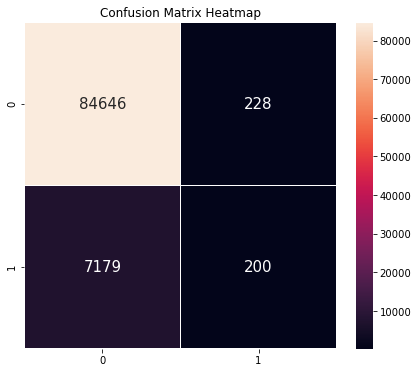

MSE :  0.08029007186758154
RMSE :  0.2833550279553577
Score de Rappel: 0.027103943623797262
Score de Precision: 0.4672897196261682

FBeta_Score:
Mesure F: 0.05123607019341617
Mesure F05: 0.10999890001099989
Mesure F2: 0.03339567192091905


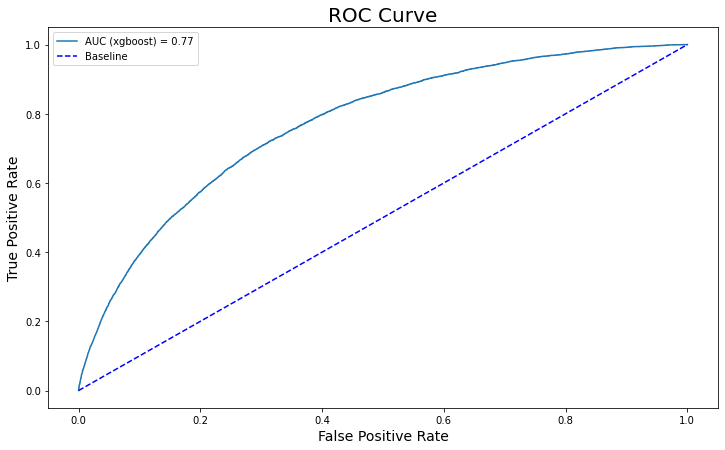

In [101]:
informationModele(X_test, y_test, grid_searchLGBMSMOTE1, 'grid_searchLGBMSMOTE1')

## Utilisation de SMOTE combiné avec un sous-échantillonnage de la classe majoritaire

In [102]:
over = SMOTE(sampling_strategy=0.1)
under = RandomUnderSampler(sampling_strategy=0.5)
steps = [('o', over), ('u', under)]
pipeline = imbpipeline(steps=steps)

X_trainSMOTE5000U, y_trainSMOTE5000U = pipeline.fit_resample(X_train5000, y_train5000)
X_trainSMOTEU, y_trainSMOTEU = pipeline.fit_resample(X_train, y_train)

In [103]:
from collections import Counter
counter = Counter(y_train)
print(counter)
counterSMOTE = Counter(y_trainSMOTEU)
print(counterSMOTE)

Counter({0: 197808, 1: 17446})
Counter({0: 39560, 1: 19780})


In [104]:
stratified_kfold = StratifiedKFold(n_splits = 3, shuffle = True, random_state = SEED)

### Random Forest

In [105]:
#param_rfr = {'n_estimators' : [800, 1200, 1500],
#             'max_depth' : [15, 20, 25],            
#             'max_features': ['auto', 'sqrt', 'log2'],
#             'min_samples_leaf': [20, 25, 30],
#             'min_samples_split': [15, 20, 25]}
#
#grid_searchRFR = GridSearchCV(estimator = RandomForestClassifier(),
#                           param_grid = param_rfr,
#                           verbose = 2,
#                           cv = stratified_kfold,
#                           scoring = 'roc_auc',
#                           refit='roc_auc',
#                           return_train_score = True,
#                           n_jobs=-1)
#
#grid_searchRFR.fit(X_trainSMOTE5000U, y_trainSMOTE5000U)

In [106]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', grid_searchRFR.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
#{'modelRandomForest__max_depth': 20, 'modelRandomForest__max_features': 'auto', 'modelRandomForest__min_samples_leaf': 20, 'modelRandomForest__min_samples_split': 25, 'modelRandomForest__n_estimators': 1200

In [107]:
grid_searchRFR = RandomForestClassifier(max_depth = 20, max_features = 'auto', min_samples_leaf = 20, min_samples_split = 25, n_estimators = 1200)

In [108]:
#grid_searchRFR = grid_searchRFR.fit(X_trainSMOTEU, y_trainSMOTEU)

In [109]:
#informationModele(X_test, y_test, grid_searchRFR, 'grid_searchRFR')

### XGBoost

In [110]:
#param_xgb = {'max_depth' : [5, 10],
#              'min_child_weight' : [75, 80],
#              'gamma' : [0.5, 1],
#              'subsample' : [0.5, 1],
#              'colsample_bytree' : [0.5, 1],
#              'colsample_bylevel' : [0.5, 1],
#              'colsample_bynode' : [0.5, 1],
#              'reg_alpha' : [0.1, 0.3],
#              'reg_lambda' : [0.1, 0.3]}
#
#grid_searchXGB = GridSearchCV(estimator = XGBClassifier(),
#                           param_grid = param_xgb,
#                           verbose = 2,
#                           cv = stratified_kfold,
#                           scoring = 'roc_auc',
#                           refit='roc_auc',
#                           return_train_score = True,
#                           n_jobs=-1)
#
#grid_searchXGB.fit(X_trainSMOTE5000U, y_trainSMOTE5000U)

In [111]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', grid_searchXGB.best_params_)
#
#Nous avons les meilleurs résultats avec les paramètres: 
# {'colsample_bylevel': 0.5, 'colsample_bynode': 0.5, 'colsample_bytree': 0.5, 'gamma': 0.5, 'max_depth': 5, 'min_child_weight': 80, 'reg_alpha': 0.3, 'reg_lambda': 0.3, 'subsample': 1

In [112]:
grid_searchXGB = XGBClassifier(colsample_bylevel = 0.5, colsample_bynode = 0.5, colsample_bytree = 0.5, gamma = 0.5, max_depth = 5, min_child_weight = 80, reg_alpha = 0.3, reg_lambda = 0.3, subsample = 1, random_state = SEED)

In [113]:
grid_searchXGB = grid_searchXGB.fit(X_trainSMOTEU, y_trainSMOTEU)

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].


[16:26:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Test Score:  0.8469209673398155
y_pred:  [0 0 0 ... 0 1 1]
Confusion Matrix of CV data:
[[74618, 10256], [3866, 3513]]


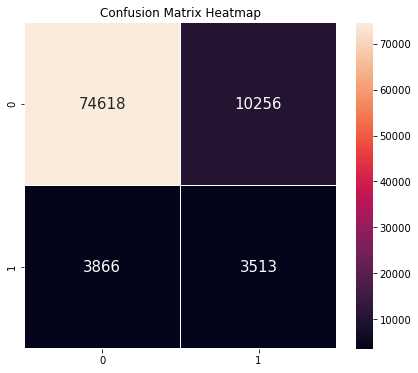

MSE :  0.1530790326601845
RMSE :  0.3912531567414945
Score de Rappel: 0.4760807697519989
Score de Precision: 0.255138354274094

FBeta_Score:
Mesure F: 0.3322299981085682
Mesure F05: 0.2812424945961092
Mesure F2: 0.40579877555735244


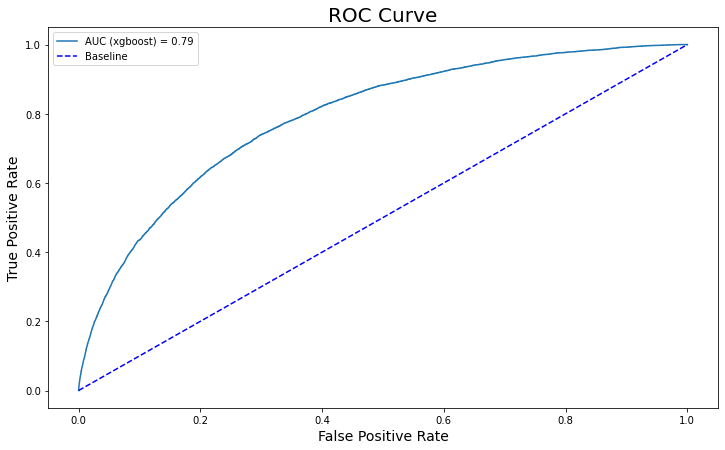

In [114]:
informationModele(X_test, y_test, grid_searchXGB, 'grid_searchXGB')

### LightGBM

In [115]:
#param_lgbm = {'num_leaves' : [35, 40, 45],
#              'max_depth' : [5, 10],
#              'min_split_gain' : [0, 0.1],
#              'min_child_weight' : [30, 35],
#              'min_child_samples' : [30, 35],
#              'subsample' : [0.5, 1],
#              'colsample_bytree' : [0.5, 1],
#              'reg_alpha' : [0.1, 0.3],
#              'reg_lambda' : [0.1, 0.3]}
#
#grid_searchLGBM = GridSearchCV(estimator = LGBMClassifier(),
#                           param_grid = param_lgbm,
#                           verbose = 2,
#                           cv = stratified_kfold,
#                           scoring = 'roc_auc',
#                           refit='roc_auc',
#                           return_train_score = True,
#                           n_jobs=-1)
#
#grid_searchLGBM.fit(X_trainSMOTE5000U, y_trainSMOTE5000U)

In [116]:
#print('Nous avons les meilleurs résultats avec les paramètres: \n', grid_searchLGBM.best_params_)
#SMOTEU
#Nous avons les meilleurs résultats avec les paramètres: 
# {'colsample_bytree': 0.5, 'max_depth': 5, 'min_child_samples': 30, 'min_child_weight': 30, 'min_split_gain': 0, 'num_leaves': 35, 'reg_alpha': 0.1, 'reg_lambda': 0.1, 'subsample': 0.5

In [117]:
grid_searchLGBM = LGBMClassifier(colsample_bytree = 0.5, max_depth = 5, min_child_samples = 30, min_child_weight = 30, min_split_gain = 0, num_leaves = 35, reg_alpha = 0.1, reg_lambda = 0.1, subsample = 0.5, random_state = SEED)

In [118]:
grid_searchLGBM = grid_searchLGBM.fit(X_trainSMOTEU, y_trainSMOTEU)

Test Score:  0.8555168937595525
y_pred:  [0 0 0 ... 0 1 1]
Confusion Matrix of CV data:
[[75453, 9421], [3908, 3471]]


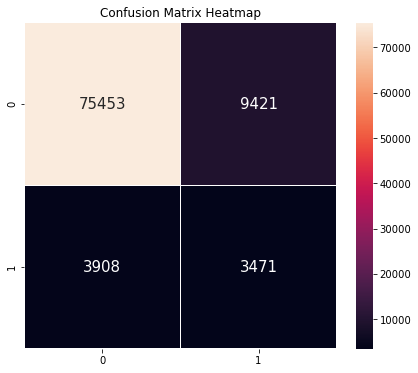

MSE :  0.14448310624044747
RMSE :  0.38010933458736246
Score de Rappel: 0.4703889415910015
Score de Precision: 0.26923673596028547

FBeta_Score:
Mesure F: 0.34245967145182776
Mesure F05: 0.2944170186777953
Mesure F2: 0.4092388228636107


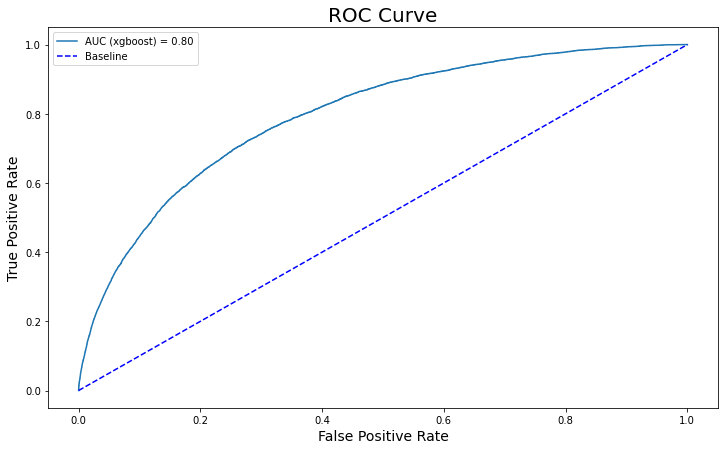

In [119]:
informationModele(X_test, y_test, grid_searchLGBM, 'grid_searchLGBM')

Nous allons maintenant regarder ce que nous obtenons avec HyperOpt.

Mais avant ça faisons une récapitulation rapide des différents résultats:

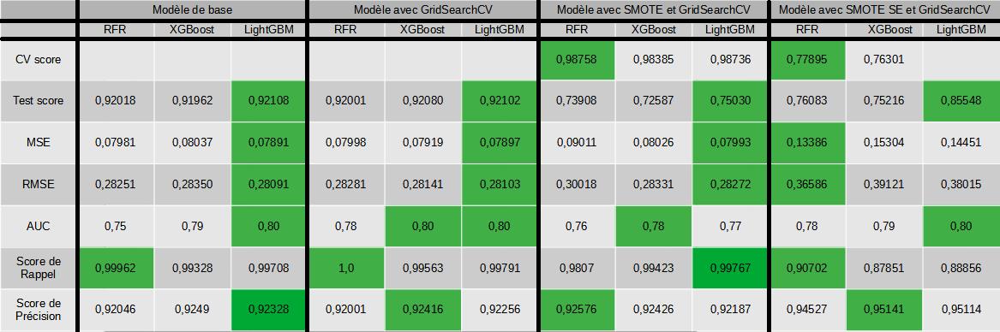

Nous pouvons que dans l'ensemble LightGBM est meilleur, nous pouvons également voir que nous avons de meilleurs résultats sans l'utilisation de SMOTE, que ce soit SMOTE seulement ou en combinant SMOTE avec un sous échantillonage.

Pour la suite nous utiliserons LightGBM, non seulement pour les résultats comme on a pu voir mais également le temps de calcul qui est bien meilleur que les autres.

## HyperOpt

In [120]:
from hyperopt import hp, tpe, fmin, Trials
from sklearn.model_selection import cross_val_score

In [121]:
space_lgbmHP = {'num_leaves' : hp.quniform('num_leaves', 20, 50, 1),         
                'max_depth' : hp.quniform('max_depth', 2, 30, 1),
                'min_split_gain' : hp.quniform('min_split_gain', 0, 0.1, 0.005),
                'min_child_weight' :  hp.quniform('min_child_weight', 0, 35, 1),
                'min_child_samples' : hp.quniform('min_child_samples', 0, 80, 1),
                'subsample' : hp.quniform('subsample', 0.5, 1, 0.05),
                'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1, 0.05),
                'reg_alpha' : hp.quniform('reg_alpha', 0.1, 1.5, 0.1),
                'reg_lambda' : hp.quniform('reg_lambda', 0.1, 1.5, 0.1),
                'solvability_threshold' : hp.quniform('solvability_threshold', 0.0, 1.0, 0.025)              
               }

### Metric ROC_AUC

In [122]:
def objectiveROC_AUC(params):
    params = {'num_leaves': int(params['num_leaves']),
              'max_depth': int(params['max_depth']),
              'min_split_gain' : params['min_split_gain'],
              'min_child_weight' : int(params['min_child_weight']),
              'min_child_samples' : int(params['min_child_samples']),
              'subsample': params['subsample'],
              'colsample_bytree': params['colsample_bytree'],
              'reg_alpha': params['reg_alpha'],
              'reg_lambda': params['reg_lambda'],
              'solvability_threshold' : params['solvability_threshold']    
             }
    
    lgbmHP = LGBMClassifier(**params)
    score = cross_val_score(lgbmHP, X_train, y_train, scoring = 'roc_auc', cv = stratified_kfold, n_jobs = -1).mean()
    return score

In [123]:
#bestROC_AUC = fmin(fn = objectiveROC_AUC, space = space_lgbmHP, algo = tpe.suggest, max_evals=20, trials = Trials(), rstate = SEED )

In [124]:
#bestROC_AUC

In [125]:
#'colsample_bytree': 0.2,
# 'max_depth': 5.0,
# 'min_child_samples': 64.0,
# 'min_child_weight': 5.0,
# 'min_split_gain': 0.075,
# 'num_leaves': 28.0,
# 'reg_alpha': 0.30000000000000004,
# 'reg_lambda': 0.4,
# 'solvability_threshold': 0.05,
# 'subsample': 0.75

In [126]:
lgbmHP = LGBMClassifier(num_leaves = 28, max_depth = 5, min_split_gain = 0.075, min_child_weight = 5, min_child_samples = 64, subsample = 0.75, colsample_bytree = 0.2, reg_alpha = 0.3, reg_lambda = 0.4, random_state=SEED)
lgbmHP.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.2, max_depth=5, min_child_samples=64,
               min_child_weight=5, min_split_gain=0.075, num_leaves=28,
               reg_alpha=0.3, reg_lambda=0.4, subsample=0.75)

Test Score:  0.92119497468917
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84718, 156], [7114, 265]]


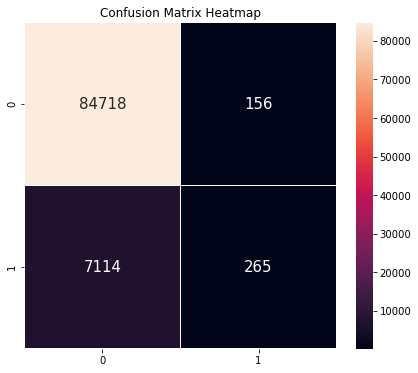

MSE :  0.07880502531083
RMSE :  0.2807223277739589
Score de Rappel: 0.035912725301531376
Score de Precision: 0.6294536817102138

FBeta_Score:
Mesure F: 0.06794871794871796
Mesure F05: 0.14619883040935674
Mesure F2: 0.044259611851554935


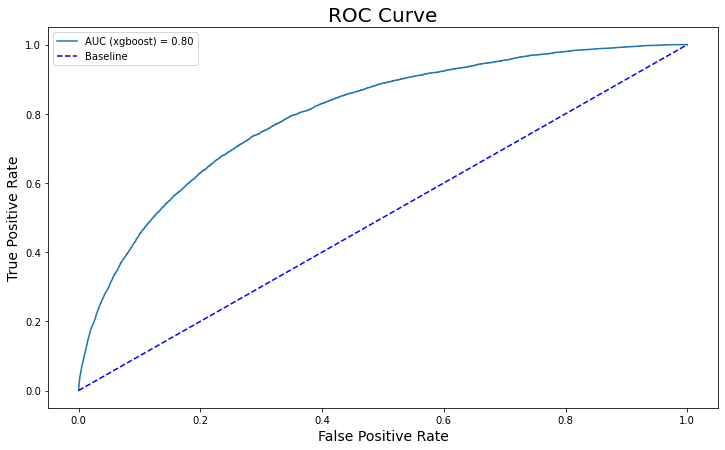

In [127]:
informationModele(X_test, y_test, lgbmHP, 'lgbmHP')

### Metric F1

In [128]:
def objectiveF1Score(params):
    params = {'num_leaves': int(params['num_leaves']),
              'max_depth': int(params['max_depth']),
              'min_split_gain' : params['min_split_gain'],
              'min_child_weight' : int(params['min_child_weight']),
              'min_child_samples' : int(params['min_child_samples']),
              'subsample': params['subsample'],
              'colsample_bytree': params['colsample_bytree'],
              'reg_alpha': params['reg_alpha'],
              'reg_lambda': params['reg_lambda'],
              'solvability_threshold' : params['solvability_threshold']    
             }
    
    lgbmHPF1 = LGBMClassifier(**params)
    score = cross_val_score(lgbmHPF1, X_train, y_train, scoring = 'f1', cv = stratified_kfold, n_jobs = -1).mean()
    return score

In [129]:
#bestF1 = fmin(fn = objectiveROC_AUC, space = space_lgbmHP, algo = tpe.suggest, max_evals=20, trials = Trials(), rstate = SEED )

In [130]:
#bestF1

In [131]:
#'colsample_bytree': 0.2,
# 'max_depth': 5.0,
# 'min_child_samples': 64.0,
# 'min_child_weight': 5.0,
# 'min_split_gain': 0.075,
# 'num_leaves': 28.0,
# 'reg_alpha': 0.30000000000000004,
# 'reg_lambda': 0.4,
# 'solvability_threshold': 0.05,
# 'subsample': 0.75

In [132]:
lgbmHPF1 = LGBMClassifier(num_leaves = 28, max_depth = 5, min_split_gain =  0.075, min_child_weight = 5, min_child_samples = 64, subsample = 0.75, colsample_bytree = 0.2, reg_alpha = 0.3, reg_lambda = 0.4, random_state=SEED)
lgbmHPF1.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.2, max_depth=5, min_child_samples=64,
               min_child_weight=5, min_split_gain=0.075, num_leaves=28,
               reg_alpha=0.3, reg_lambda=0.4, subsample=0.75)

Test Score:  0.92119497468917
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84718, 156], [7114, 265]]


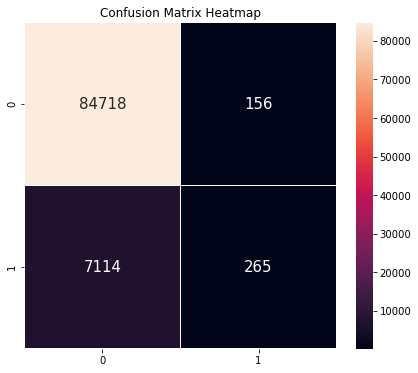

MSE :  0.07880502531083
RMSE :  0.2807223277739589
Score de Rappel: 0.035912725301531376
Score de Precision: 0.6294536817102138

FBeta_Score:
Mesure F: 0.06794871794871796
Mesure F05: 0.14619883040935674
Mesure F2: 0.044259611851554935


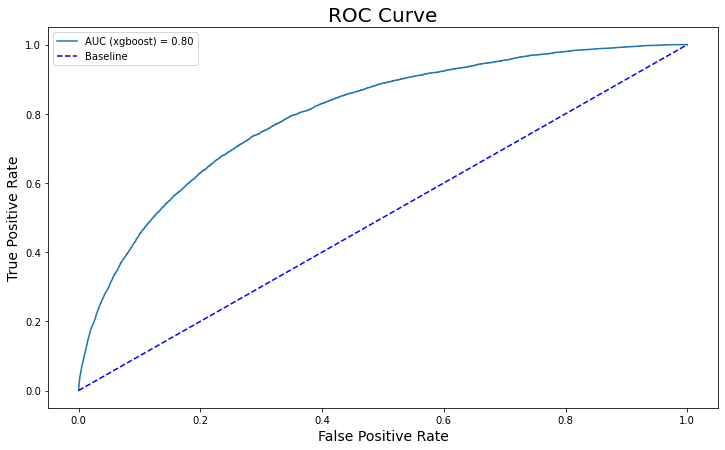

In [133]:
informationModele(X_test, y_test, lgbmHPF1, 'lgbmHPF1')

### Metric ROC_AUC avec SMOTE SE

In [134]:
def objectiveROC_AUCSMOTEU(params):
    params = {'num_leaves': int(params['num_leaves']),
              'max_depth': int(params['max_depth']),
              'min_split_gain' : params['min_split_gain'],
              'min_child_weight' : int(params['min_child_weight']),
              'min_child_samples' : int(params['min_child_samples']),
              'subsample': params['subsample'],
              'colsample_bytree': params['colsample_bytree'],
              'reg_alpha': params['reg_alpha'],
              'reg_lambda': params['reg_lambda'],
              'solvability_threshold' : params['solvability_threshold']    
             }
    
    lgbmHPSMOTEU = LGBMClassifier(**params)
    score = cross_val_score(lgbmHPSMOTEU, X_trainSMOTEU, y_trainSMOTEU, scoring = 'roc_auc', cv = stratified_kfold, n_jobs = -1).mean()
    return score

In [135]:
#bestROC_AUCSMOTEU = fmin(fn = objectiveROC_AUCSMOTEU, space = space_lgbmHP, algo = tpe.suggest, max_evals=20, trials = Trials(), rstate = SEED )

In [136]:
#bestROC_AUCSMOTEU

In [137]:
#'colsample_bytree': 0.30000000000000004,
# 'max_depth': 2.0,
# 'min_child_samples': 59.0,
# 'min_child_weight': 13.0,
# 'min_split_gain': 0.03,
# 'num_leaves': 37.0,
# 'reg_alpha': 0.6000000000000001,
# 'reg_lambda': 1.4000000000000001,
# 'solvability_threshold': 0.17500000000000002,
# 'subsample': 0.7000000000000001

In [138]:
lgbmHPSMOTE_SE = LGBMClassifier(num_leaves = 37, max_depth = 2, min_split_gain =  0.03, min_child_weight = 13, min_child_samples = 59, subsample = 0.7, colsample_bytree = 0.3, reg_alpha = 0.6, reg_lambda = 1.4, random_state=SEED)
lgbmHPSMOTE_SE.fit(X_trainSMOTEU, y_trainSMOTEU)

LGBMClassifier(colsample_bytree=0.3, max_depth=2, min_child_samples=59,
               min_child_weight=13, min_split_gain=0.03, num_leaves=37,
               reg_alpha=0.6, reg_lambda=1.4, subsample=0.7)

Test Score:  0.8512135106717397
y_pred:  [0 0 0 ... 0 1 1]
Confusion Matrix of CV data:
[[75181, 9693], [4033, 3346]]


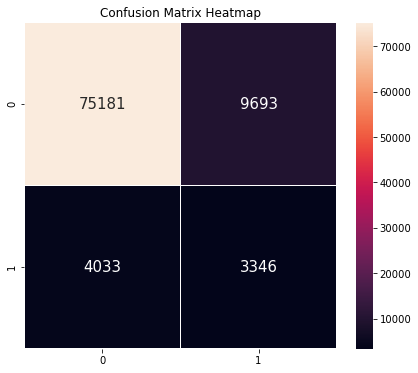

MSE :  0.14878648932826033
RMSE :  0.3857285176497329
Score de Rappel: 0.4534489768261282
Score de Precision: 0.2566147710714012

FBeta_Score:
Mesure F: 0.32775002448819673
Mesure F05: 0.2810111699000588
Mesure F2: 0.39313829162260605


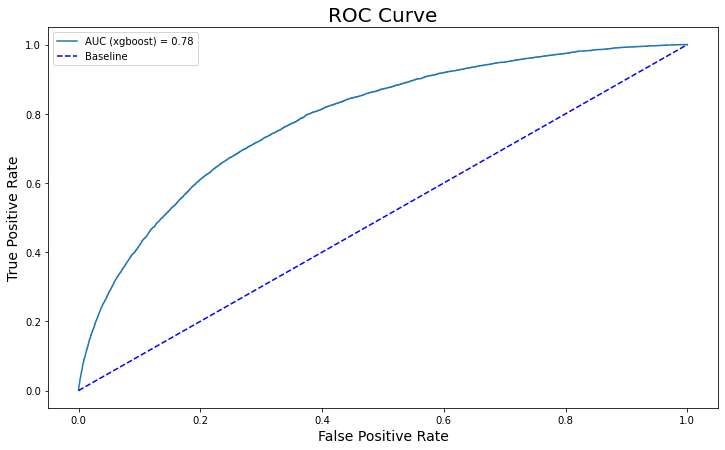

In [139]:
informationModele(X_test, y_test, lgbmHPSMOTE_SE, 'lgbmHPSMOTE_SE')

Nous pouvons voir que le score AUC est legérement moins bon qu'avec la recherche GridSearchCv, mais pour le coût métier nous regarderons tout de même ce que l'on aura.

Nous savons qu'un faux négatif coûte 10x plus cher qu'un faux positif, c'est pour ça que nous devons essayer d'avoir le moins de faux négatif possible, nous allons donc définir une nouvelle métrique.

In [140]:
def coutMetier(y_test, y_pred, fn_value = 10, fp_value = 1):
    tp, fp, fn, tn = confusion_matrix(y_test, y_pred).ravel()    
    scoreMetier = fn*fn_value + fp*fp_value
    return scoreMetier

Maintenant regardons ce que nous avons en modifiant le seuil des meilleurs modèles (score roc_auc = 80 càd XGBoost et LGBM avec GridSearchCv et LGBM avec SMOTE et SE etGridSearchCV):

In [141]:
thresholds = [0.00, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4, 0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1]

In [142]:
y_predXGBGRIDM = xgbGrid.predict_proba(X_test)[::,1]
y_predLGBMGRIDM = lgbmGrid.predict_proba(X_test)[::,1]

y_predXGBGRID = xgbGrid.predict(X_test)
y_predLGBMGRID = lgbmGrid.predict(X_test)

Nous allons regarder dans un premier temps le nombre de 1 et de 0 avant l'optimisation du seuil:

In [143]:
from collections import Counter
counter = Counter(y_predXGBGRID)
print(counter)

Counter({0: 91424, 1: 829})


In [144]:
from collections import Counter
counter = Counter(y_predLGBMGRID)
print(counter)

Counter({0: 91798, 1: 455})


##### Modèle XGBoost avec GridSearchCV

In [145]:
coutmetier = 1000000000
listeSeuil = []

for t in thresholds:
    predicted_class1XGBGRID = np.zeros(y_predXGBGRIDM.shape)
    predicted_class1XGBGRID[y_predXGBGRIDM > t] = 1
    coutAReduire = coutMetier(y_test, predicted_class1XGBGRID)
    if coutAReduire < coutmetier:
        listeSeuil.append(t)
        coutmetier = coutAReduire
    else:
        continue

In [146]:
listeSeuil

[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]

In [147]:
predicted_class1XGBGRID = np.zeros(y_predXGBGRIDM.shape)
predicted_class1XGBGRID[y_predXGBGRIDM > 0.1] = 1
coutAReduire = coutMetier(y_test, predicted_class1XGBGRID)
print("Coût métier:", coutAReduire)

Coût métier: 44379


Regardons maintenant le nombre de 1 et de 0 après avoir utilisé le meilleur seuil, nous ferons de même après chaque modèle:

In [148]:
from collections import Counter
counter = Counter(predicted_class1XGBGRID)
print(counter)

Counter({0.0: 69337, 1.0: 22916})


##### Modèle LightGBM avec GridSearchCV

In [149]:
coutmetier = 1000000000
listeSeuil = []

for t in thresholds:
    predicted_class1LGBMGRID = np.zeros(y_predLGBMGRIDM.shape)
    predicted_class1LGBMGRID[y_predLGBMGRIDM > t] = 1
    coutAReduire = coutMetier(y_test, predicted_class1LGBMGRID)
    #print(t, ':', coutAReduire)
    if coutAReduire < coutmetier:
        listeSeuil.append(t)
        coutmetier = coutAReduire
    else:
        continue

In [150]:
listeSeuil

[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09]

In [151]:
predicted_class1LGBMGRID = np.zeros(y_predLGBMGRIDM.shape)
predicted_class1LGBMGRID[y_predLGBMGRIDM > 0.09] = 1
coutAReduire = coutMetier(y_test, predicted_class1LGBMGRID)
print("Coût métier:", coutAReduire)

Coût métier: 43574


In [152]:
from collections import Counter
counter = Counter(predicted_class1LGBMGRID)
print(counter)

Counter({0.0: 65665, 1.0: 26588})


Regardons d'autre seuil pour le meilleur modèle, nous prendrons 0.35 et 0.8 par défaut, afin de voir ce que nous obtiendrons:

In [153]:
predicted_class1LGBMGRID35 = np.zeros(y_predLGBMGRIDM.shape)
predicted_class1LGBMGRID35[y_predLGBMGRIDM > 0.35] = 1
coutAReduire = coutMetier(y_test, predicted_class1LGBMGRID35)
print("Coût métier:", coutAReduire)

Coût métier: 65151


In [154]:
from collections import Counter
counter = Counter(predicted_class1LGBMGRID35)
print(counter)

Counter({0.0: 90134, 1.0: 2119})


In [155]:
predicted_class1LGBMGRID80 = np.zeros(y_predLGBMGRIDM.shape)
predicted_class1LGBMGRID80[y_predLGBMGRIDM > 0.80] = 1
coutAReduire = coutMetier(y_test, predicted_class1LGBMGRID80)
print("Coût métier:", coutAReduire)

Coût métier: 73690


In [156]:
from collections import Counter
counter = Counter(predicted_class1LGBMGRID80)
print(counter)

Counter({0.0: 92243, 1.0: 10})


Nous avons notre coût métier au plus faible lorsque le seuil est de 0.09 et que nous prenons le modèle LightGBM et GRidSearchCV, dans ce cas le coût métier vaut 43754.

Nous allons faire un nouvelle entraînement avec ce seuil:

### Avec le meilleur seuil trouvé

In [157]:
space_lgbmHPSeuil = {'num_leaves' : hp.quniform('num_leaves', 20, 50, 1),         
                     'max_depth' : hp.quniform('max_depth', 2, 30, 1),
                     'min_split_gain' : hp.quniform('min_split_gain', 0, 0.1, 0.005),
                     'min_child_weight' :  hp.quniform('min_child_weight', 0, 35, 1),
                     'min_child_samples' : hp.quniform('min_child_samples', 0, 80, 1),
                     'subsample' : hp.quniform('subsample', 0.5, 1, 0.05),
                     'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1, 0.05),
                     'reg_alpha' : hp.quniform('reg_alpha', 0.1, 1.5, 0.1),
                     'reg_lambda' : hp.quniform('reg_lambda', 0.1, 1.5, 0.1),
                     'class_weight' : hp.choice('class_weight', [None, 'balanced']),
                     'solvability_threshold' : 0.09          
                    }

In [158]:
def objectiveRocAucSeuil(params):
    params = {'num_leaves': int(params['num_leaves']),
              'max_depth': int(params['max_depth']),
              'min_split_gain' : params['min_split_gain'],
              'min_child_weight' : int(params['min_child_weight']),
              'min_child_samples' : int(params['min_child_samples']),
              'subsample': params['subsample'],
              'colsample_bytree': params['colsample_bytree'],
              'reg_alpha': params['reg_alpha'],
              'reg_lambda': params['reg_lambda'],
              'class_weight' : params['class_weight'],
              'solvability_threshold' : params['solvability_threshold']    
             }
    
    lgbmHPSeuil = LGBMClassifier(**params)
    score = -cross_val_score(lgbmHPSeuil, X_train, y_train, scoring = 'roc_auc', cv = stratified_kfold, n_jobs = -1).mean()
    return score

In [159]:
#bestRocAucSeuil = fmin(fn = objectiveRocAucSeuil, space = space_lgbmHPSeuil, algo = tpe.suggest, max_evals = 15, trials = Trials(), rstate = SEED )

In [160]:
#bestRocAucSeuil

In [161]:
#'class_weight': 0,
# 'colsample_bytree': 0.6000000000000001,
# 'max_depth': 14.0,
# 'min_child_samples': 52.0,
# 'min_child_weight': 25.0,
# 'min_split_gain': 0.06,
# 'num_leaves': 28.0,
# 'reg_alpha': 0.2,
# 'reg_lambda': 0.2,
# 'subsample': 0.7000000000000001

In [162]:
lgbmHPSeuil = LGBMClassifier(num_leaves = 28, max_depth = 14, min_split_gain = 0.06, min_child_weight = 25, min_child_samples = 52, subsample = 0.70, colsample_bytree = 0.60, reg_alpha = 0.2, reg_lambda = 0.2, class_weight = None,  random_state=SEED)
lgbmHPSeuil.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.6, max_depth=14, min_child_samples=52,
               min_child_weight=25, min_split_gain=0.06, num_leaves=28,
               reg_alpha=0.2, reg_lambda=0.2, subsample=0.7)

Test Score:  0.9212274939568361
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84629, 245], [7022, 357]]


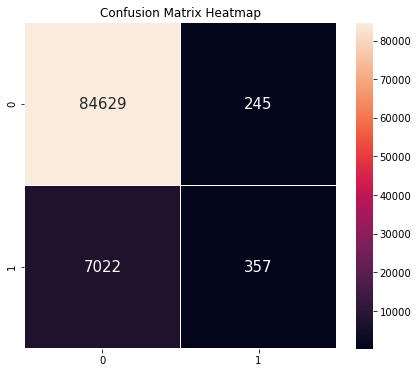

MSE :  0.07877250604316391
RMSE :  0.2806644010970467
Score de Rappel: 0.048380539368478116
Score de Precision: 0.5930232558139535

FBeta_Score:
Mesure F: 0.08946247337426388
Mesure F05: 0.18238479615816902
Mesure F2: 0.059266883591207915


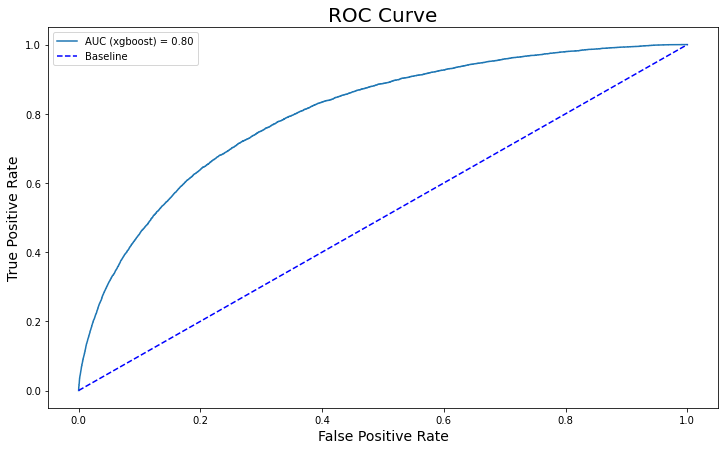

In [163]:
informationModele(X_test, y_test, lgbmHPSeuil, 'lgbmHPSeuil')

In [164]:
joblib.dump(lgbmHPSeuil, r'C:\Users\Alexis\lgbmHPSeuil.joblib')

['C:\\Users\\Alexis\\lgbmHPSeuil.joblib']

Regardons maintenant ce que nous obtenons lorsque nous prenons la liste des prédictions après avoir modifié le seuil, nous ferons une rapide fonction, semblable à ce qu'on a pu faire précèdemment mais qui va s'adapter à ce nouveau cas de figure:

In [165]:
y_predLgbmHPSeuilProba = lgbmHPSeuil.predict_proba(X_test)[::,1]
y_predLgbmHPSeuil = lgbmHPSeuil.predict(X_test)

In [166]:
def informationModeleSeuil(y_test, y_predSeuil):

    print("Confusion Matrix of CV data:")
    #conf_mat = confusion_matrix(y_test, y_predSeuil)
    tp, fp, fn, tn = confusion_matrix(y_test, y_predSeuil).ravel() 
    conf_mat = [[tp, fp],
                [fn, tn]]
    conf_mat = pd.DataFrame(conf_mat, columns = ['0','1'], index = ['0','1'])
    plt.figure(figsize = (7,6))
    plt.title('Confusion Matrix Heatmap')
    sns.heatmap(conf_mat, annot = True, fmt = 'g', linewidth = 0.5, annot_kws = {'size' : 15})
    plt.show()
    
    print("MSE : ", mean_squared_error(y_test, y_predSeuil))
    print("RMSE : ", math.sqrt(mean_squared_error(y_test, y_predSeuil)))

    auc_xg = roc_auc_score(y_test, y_predSeuil)
    fpr_xg, tpr_xg, thresholds_xg = roc_curve(y_test, y_predSeuil)
    plt.figure(figsize=(12, 7))
    plt.plot(fpr_xg, tpr_xg, label=f'AUC = {auc_xg:.2f}')
    plt.plot([0, 1], [0, 1], color='blue', linestyle='--', label='Baseline')
    plt.title('ROC Curve', size=20)
    plt.xlabel('False Positive Rate', size=14)
    plt.ylabel('True Positive Rate', size=14)
    plt.legend();
    
    print("Score de Rappel:", recall_score(y_test, y_predSeuil))
    print("Score de Precision:", precision_score(y_test, y_predSeuil))    
    
    print("\nFBeta_Score:")
    mesureF = fbeta_score(y_test, y_predSeuil, beta = 1)
    mesureF05 = fbeta_score(y_test, y_predSeuil, beta = 0.5)
    mesureF2 = fbeta_score(y_test, y_predSeuil, beta = 2)
    print("Mesure F:", mesureF)
    print("Mesure F05:", mesureF05)
    print("Mesure F2:", mesureF2)

Confusion Matrix of CV data:


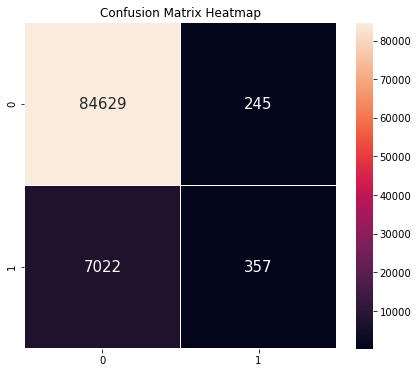

MSE :  0.07877250604316391
RMSE :  0.2806644010970467
Score de Rappel: 0.048380539368478116
Score de Precision: 0.5930232558139535

FBeta_Score:
Mesure F: 0.08946247337426388
Mesure F05: 0.18238479615816902
Mesure F2: 0.059266883591207915


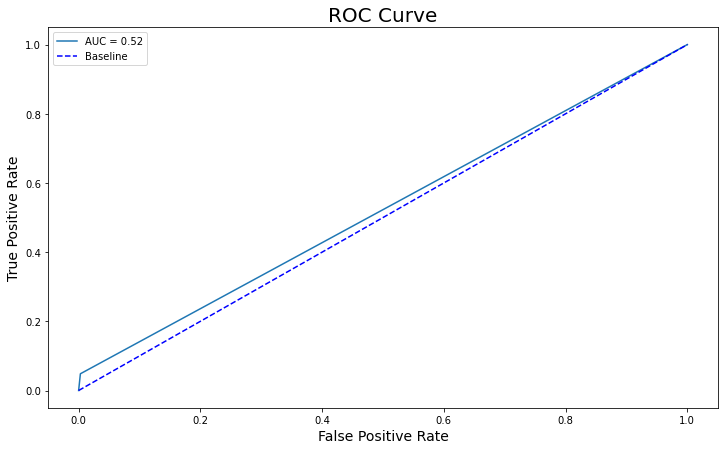

In [167]:
informationModeleSeuil(y_test, y_predLgbmHPSeuil)

In [168]:
with open('lgbmHPSeuil.pkl', 'wb') as fid:
    pickle.dump(lgbmHPSeuil, fid) 

### Avec un seuil aléatoire afin de comparé, ici ce sera 0.80

In [169]:
space_lgbmHPSeuil80 = {'num_leaves' : hp.quniform('num_leaves', 20, 50, 1),         
                       'max_depth' : hp.quniform('max_depth', 2, 30, 1),
                       'min_split_gain' : hp.quniform('min_split_gain', 0, 0.1, 0.005),
                       'min_child_weight' :  hp.quniform('min_child_weight', 0, 35, 1),
                       'min_child_samples' : hp.quniform('min_child_samples', 0, 80, 1),
                       'subsample' : hp.quniform('subsample', 0.5, 1, 0.05),
                       'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1, 0.05),
                       'reg_alpha' : hp.quniform('reg_alpha', 0.1, 1.5, 0.1),
                       'reg_lambda' : hp.quniform('reg_lambda', 0.1, 1.5, 0.1),
                       'class_weight' : hp.choice('class_weight', [None, 'balanced']),
                       'solvability_threshold' : 0.80            
                      }

In [170]:
def objectiveRocAucSeuil80(params):
    params = {'num_leaves': int(params['num_leaves']),
              'max_depth': int(params['max_depth']),
              'min_split_gain' : params['min_split_gain'],
              'min_child_weight' : int(params['min_child_weight']),
              'min_child_samples' : int(params['min_child_samples']),
              'subsample': params['subsample'],
              'colsample_bytree': params['colsample_bytree'],
              'reg_alpha': params['reg_alpha'],
              'reg_lambda': params['reg_lambda'],
              'class_weight' : params['class_weight'],
              'solvability_threshold' : params['solvability_threshold']    
             }
    
    lgbmHPSeuil80 = LGBMClassifier(**params)
    score = -cross_val_score(lgbmHPSeuil80, X_train, y_train, scoring = 'roc_auc', cv = stratified_kfold, n_jobs = -1).mean()
    return score

In [171]:
#bestRocAucSeuil80 = fmin(fn = objectiveRocAucSeuil80, space = space_lgbmHPSeuil80, algo = tpe.suggest, max_evals = 15, trials = Trials(), rstate = SEED )

In [172]:
#bestRocAucSeuil80

In [173]:
#'class_weight': 0,
# 'colsample_bytree': 0.65,
# 'max_depth': 13.0,
# 'min_child_samples': 46.0,
# 'min_child_weight': 20.0,
# 'min_split_gain': 0.05,
# 'num_leaves': 41.0,
# 'reg_alpha': 1.4000000000000001,
# 'reg_lambda': 0.30000000000000004,
# 'subsample': 0.9

In [174]:
lgbmHPSeuil80 = LGBMClassifier(num_leaves = 27, max_depth = 30, min_split_gain = 0.095, min_child_weight = 34, min_child_samples = 72, subsample = 0.7, colsample_bytree = 0.65, reg_alpha = 1.4, reg_lambda = 1.3, class_weight = None, random_state=SEED)
lgbmHPSeuil80.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.65, max_depth=30, min_child_samples=72,
               min_child_weight=34, min_split_gain=0.095, num_leaves=27,
               reg_alpha=1.4, reg_lambda=1.3, subsample=0.7)

Test Score:  0.9214334493187213
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84638, 236], [7012, 367]]


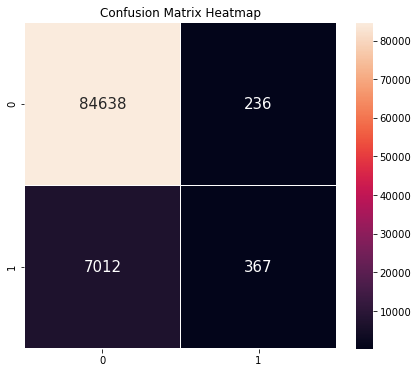

MSE :  0.07856655068127866
RMSE :  0.28029725414509266
Score de Rappel: 0.049735736549667973
Score de Precision: 0.6086235489220564

FBeta_Score:
Mesure F: 0.0919569030318216
Mesure F05: 0.18741701562659582
Mesure F2: 0.060924997509877475


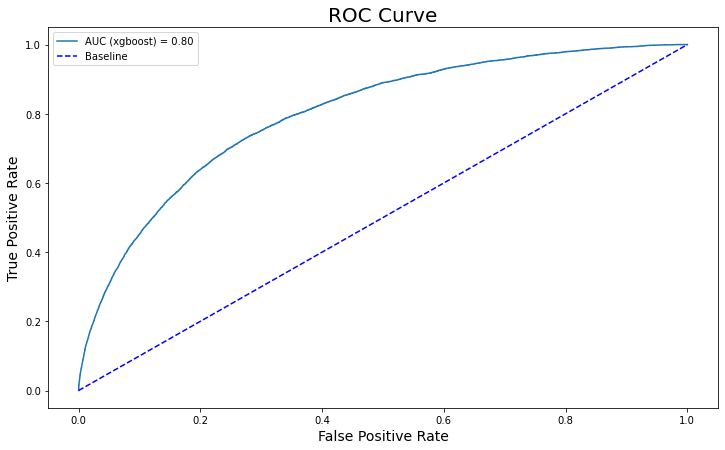

In [175]:
informationModele(X_test, y_test, lgbmHPSeuil80, 'lgbmHPSeuil80')

Confusion Matrix of CV data:


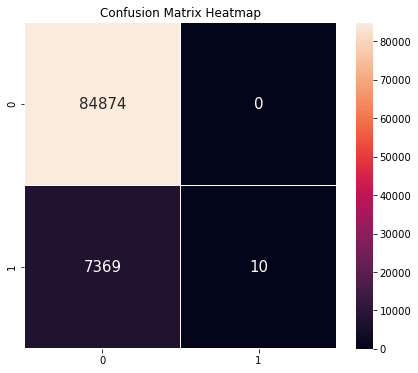

MSE :  0.07987816114381104
RMSE :  0.2826272477023598
Score de Rappel: 0.001355197181189863
Score de Precision: 1.0

FBeta_Score:
Mesure F: 0.002706726214643389
Mesure F05: 0.0067394527564361775
Mesure F2: 0.001693422746054325


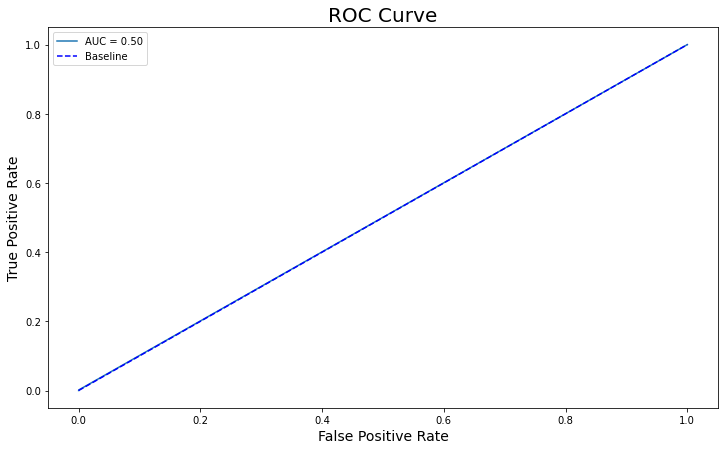

In [176]:
informationModeleSeuil(y_test, predicted_class1LGBMGRID80)

### Avec un seuil aléatoire afin de comparé, ici ce sera 0.35

In [177]:
space_lgbmHPSeuil35 = {'num_leaves' : hp.quniform('num_leaves', 20, 50, 1),         
                       'max_depth' : hp.quniform('max_depth', 2, 30, 1),
                       'min_split_gain' : hp.quniform('min_split_gain', 0, 0.1, 0.005),
                       'min_child_weight' :  hp.quniform('min_child_weight', 0, 35, 1),
                       'min_child_samples' : hp.quniform('min_child_samples', 0, 80, 1),
                       'subsample' : hp.quniform('subsample', 0.5, 1, 0.05),
                       'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1, 0.05),
                       'reg_alpha' : hp.quniform('reg_alpha', 0.1, 1.5, 0.1),
                       'reg_lambda' : hp.quniform('reg_lambda', 0.1, 1.5, 0.1),
                       'class_weight' : hp.choice('class_weight', [None, 'balanced']),
                       'solvability_threshold' : 0.35            
                       }

In [178]:
def objectiveRocAucSeuil35(params):
    params = {'num_leaves': int(params['num_leaves']),
              'max_depth': int(params['max_depth']),
              'min_split_gain' : params['min_split_gain'],
              'min_child_weight' : int(params['min_child_weight']),
              'min_child_samples' : int(params['min_child_samples']),
              'subsample': params['subsample'],
              'colsample_bytree': params['colsample_bytree'],
              'reg_alpha': params['reg_alpha'],
              'reg_lambda': params['reg_lambda'],
              'class_weight': params['class_weight'],
              'solvability_threshold' : params['solvability_threshold']    
             }
    
    lgbmHPSeuil35 = LGBMClassifier(**params)
    score = -cross_val_score(lgbmHPSeuil35, X_train, y_train, scoring = 'roc_auc', cv = stratified_kfold, n_jobs = -1).mean()
    return score

In [179]:
#bestRocAucSeuil35 = fmin(fn = objectiveRocAucSeuil35, space = space_lgbmHPSeuil35, algo = tpe.suggest, max_evals = 15, trials = Trials(), rstate = SEED )

In [180]:
#bestRocAucSeuil35

In [181]:
#'class_weight': 1,
# 'colsample_bytree': 0.9,
# 'max_depth': 8.0,
# 'min_child_samples': 12.0,
# 'min_child_weight': 23.0,
# 'min_split_gain': 0.04,
# 'num_leaves': 45.0,
# 'reg_alpha': 0.6000000000000001,
# 'reg_lambda': 1.3,
# 'subsample': 0.5

In [182]:
lgbmHPSeuil35 = LGBMClassifier(num_leaves = 45, max_depth = 8, min_split_gain = 0.04, min_child_weight = 23, min_child_samples = 12, subsample = 0.5, colsample_bytree = 0.9, reg_alpha = 0.6, reg_lambda = 1.3, class_weight = None, random_state=SEED)
#lgbmHPSeuil35.fit(X_train, y_train)

In [183]:
lgbmHPSeuil35.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.9, max_depth=8, min_child_samples=12,
               min_child_weight=23, min_split_gain=0.04, num_leaves=45,
               reg_alpha=0.6, reg_lambda=1.3, subsample=0.5)

Test Score:  0.921303372248057
y_pred:  [0 0 0 ... 0 0 0]
Confusion Matrix of CV data:
[[84612, 262], [6998, 381]]


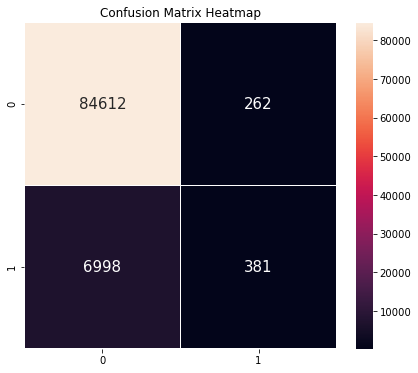

MSE :  0.07869662775194303
RMSE :  0.28052919233467133
Score de Rappel: 0.051633012603333785
Score de Precision: 0.5925349922239502

FBeta_Score:
Mesure F: 0.0949887808526552
Mesure F05: 0.1914380464274947
Mesure F2: 0.06316522431115089


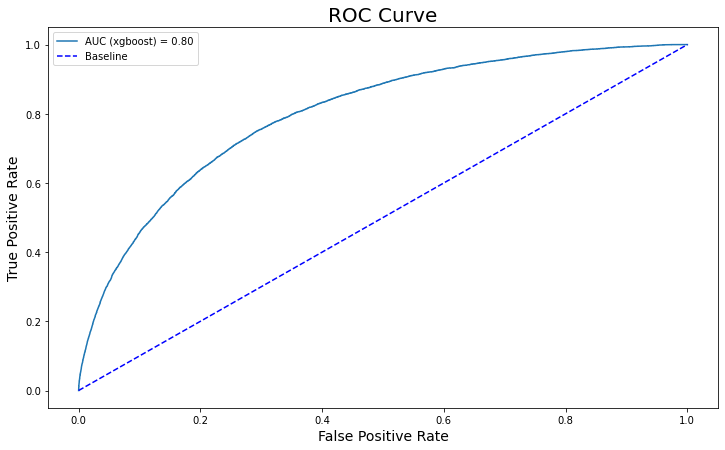

In [184]:
informationModele(X_test, y_test, lgbmHPSeuil35, 'lgbmHPSeuil35')

Confusion Matrix of CV data:


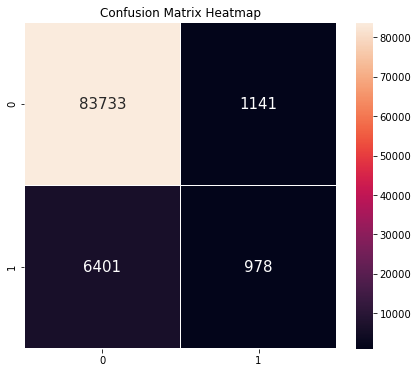

MSE :  0.0817534389125557
RMSE :  0.28592558282279623
Score de Rappel: 0.13253828432036863
Score de Precision: 0.46153846153846156

FBeta_Score:
Mesure F: 0.20593809222994316
Mesure F05: 0.3084200567644277
Mesure F2: 0.1545756282598388


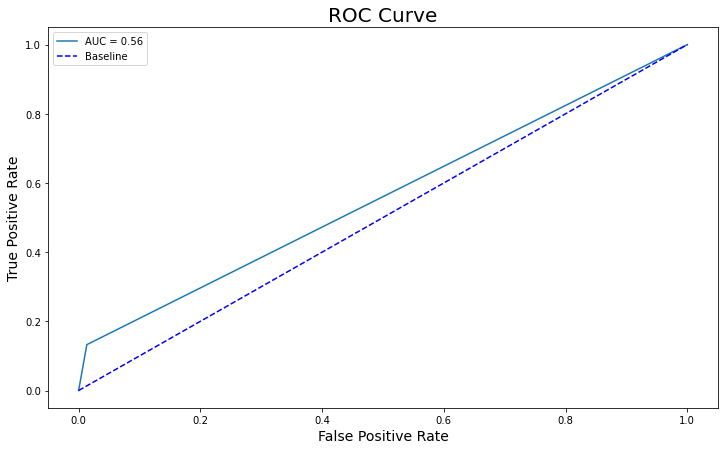

In [185]:
informationModeleSeuil(y_test, predicted_class1LGBMGRID35)

Nous pouvons voir qu'en procédant de cette manière cela ne donne pas grand chose de concluant, nous allons donc essayer autre chose cette fois ci, nous allons écrire une nouvelle fonction qui testera notre meilleur seuil qui est 0.09 ainsi que d'autre seuil aléatoire afin de comparer:

In [186]:
y_predLgbmHPSeuil = lgbmHPSeuil.predict_proba(X_test)[::,1]

In [187]:
def informationModeleSeuil(y_test, seuil):

    y_predSeuil = np.zeros(y_predLgbmHPSeuil.shape)
    y_predSeuil[y_predLgbmHPSeuil > seuil] = 1
    coutAReduire = coutMetier(y_test, y_predSeuil)
    print("Coût métier:", coutAReduire)
    
    print("Confusion Matrix of CV data:")
    conf_mat = confusion_matrix(y_test, y_predSeuil)
    conf_mat = pd.DataFrame(conf_mat, columns = ['0','1'], index = ['0','1'])
    plt.figure(figsize = (7,6))
    plt.title('Confusion Matrix Heatmap')
    sns.heatmap(conf_mat, annot = True, fmt = 'g', linewidth = 0.5, annot_kws = {'size' : 15})
    plt.show()
    
    print("MSE : ", mean_squared_error(y_test, y_predSeuil))
    print("RMSE : ", math.sqrt(mean_squared_error(y_test, y_predSeuil)))

    auc_xg = roc_auc_score(y_test, y_predSeuil)
    print("Score Roc: ", auc_xg)
    
    print("Score de Rappel:", recall_score(y_test, y_predSeuil))
    print("Score de Precision:", precision_score(y_test, y_predSeuil))    
    
    print("\nFBeta_Score:")
    mesureF = fbeta_score(y_test, y_predSeuil, beta = 1)
    mesureF05 = fbeta_score(y_test, y_predSeuil, beta = 0.5)
    mesureF2 = fbeta_score(y_test, y_predSeuil, beta = 2)
    print("Mesure F:", mesureF)
    print("Mesure F05:", mesureF05)
    print("Mesure F2:", mesureF2)

In [188]:
listeSeuilRandom = []
for n in range(10):
    listeSeuilRandom.append(random.randint(0,101) / 100)

In [189]:
listeSeuil = [0.09] + listeSeuilRandom

Seuil:  0.09
Coût métier: 43483
Confusion Matrix of CV data:


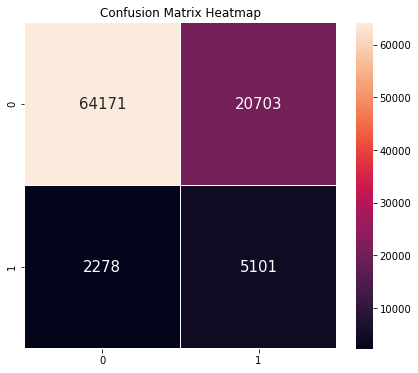

MSE :  0.24910843007815464
RMSE :  0.4991076337606495
Score Roc:  0.7236798956940461
Score de Rappel: 0.6912860821249491
Score de Precision: 0.19768252984033483

FBeta_Score:
Mesure F: 0.3074465840942651
Mesure F05: 0.23061621230616214
Mesure F2: 0.4610448300795373
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.33
Coût métier: 62480
Confusion Matrix of CV data:


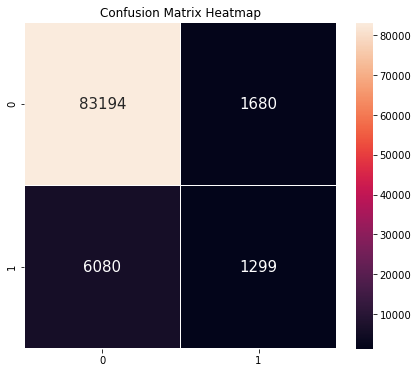

MSE :  0.08411650569629171
RMSE :  0.2900284567008757
Score Roc:  0.5781230330947315
Score de Rappel: 0.17604011383656323
Score de Precision: 0.43605236656596175

FBeta_Score:
Mesure F: 0.250820621741649
Mesure F05: 0.33661570355014253
Mesure F2: 0.19987690413909834
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.03
Coût métier: 57481
Confusion Matrix of CV data:


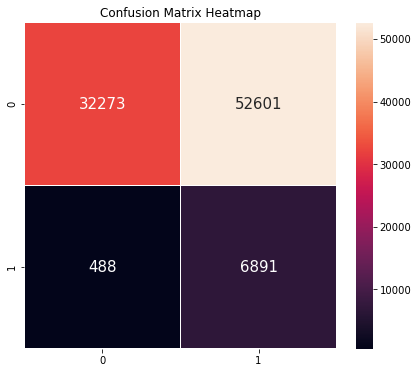

MSE :  0.5754718003750555
RMSE :  0.7585985765706759
Score Roc:  0.6570561946464887
Score de Rappel: 0.9338663775579347
Score de Precision: 0.11583069992604048

FBeta_Score:
Mesure F: 0.2060983086838839
Mesure F05: 0.1404337530110415
Mesure F2: 0.3871000359518245
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.75
Coût métier: 73440
Confusion Matrix of CV data:


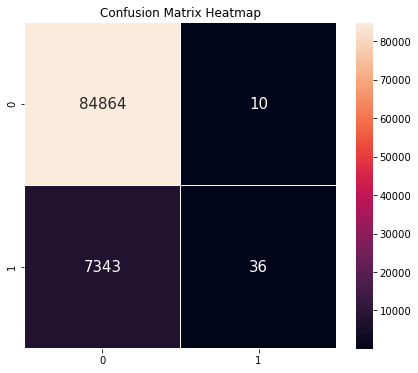

MSE :  0.07970472504959188
RMSE :  0.2823202526380137
Score Roc:  0.5023804440700492
Score de Rappel: 0.004878709852283507
Score de Precision: 0.782608695652174

FBeta_Score:
Mesure F: 0.009696969696969695
Mesure F05: 0.023800079333597776
Mesure F2: 0.0060888979094783835
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.45
Coût métier: 68933
Confusion Matrix of CV data:


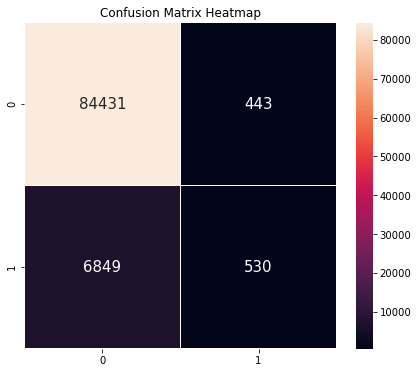

MSE :  0.07904349994038135
RMSE :  0.2811467587228801
Score Roc:  0.5333029743766309
Score de Rappel: 0.07182545060306275
Score de Precision: 0.5447070914696814

FBeta_Score:
Mesure F: 0.12691570881226055
Mesure F05: 0.2351166711028303
Mesure F2: 0.08691659286955951
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.5
Coût métier: 70465
Confusion Matrix of CV data:


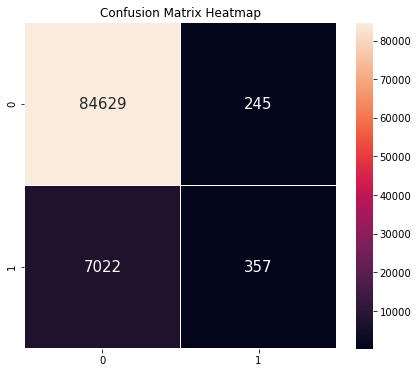

MSE :  0.07877250604316391
RMSE :  0.2806644010970467
Score Roc:  0.5227469537099714
Score de Rappel: 0.048380539368478116
Score de Precision: 0.5930232558139535

FBeta_Score:
Mesure F: 0.08946247337426388
Mesure F05: 0.18238479615816902
Mesure F2: 0.059266883591207915
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.3
Coût métier: 60331
Confusion Matrix of CV data:


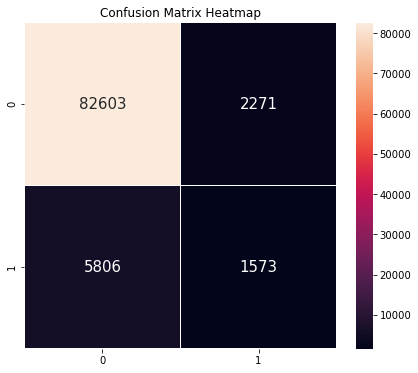

MSE :  0.08755270831300879
RMSE :  0.2958930690519952
Score Roc:  0.5932076028819622
Score de Rappel: 0.21317251660116546
Score de Precision: 0.40920915712799166

FBeta_Score:
Mesure F: 0.28031720573821617
Mesure F05: 0.34563832124807736
Mesure F2: 0.23576139088729015
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.16
Coût métier: 48247
Confusion Matrix of CV data:


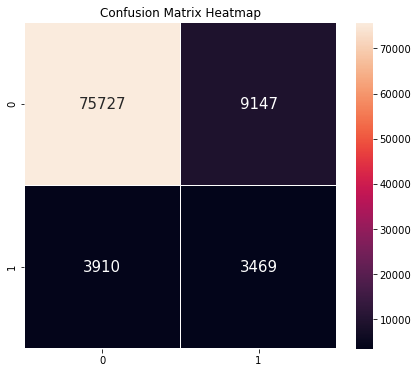

MSE :  0.1415346926387218
RMSE :  0.3762109682594618
Score Roc:  0.6811731910095163
Score de Rappel: 0.4701179021547635
Score de Precision: 0.27496829422954977

FBeta_Score:
Mesure F: 0.3469867466866717
Mesure F05: 0.2998634234047335
Mesure F2: 0.4116823317193582
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.41
Coût métier: 67087
Confusion Matrix of CV data:


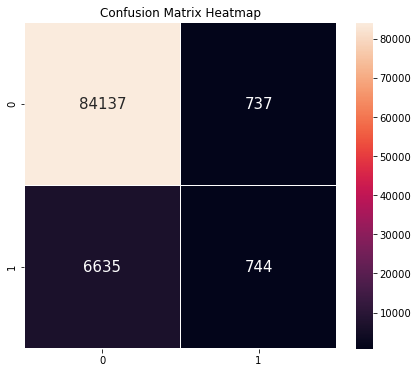

MSE :  0.07991068041147713
RMSE :  0.28268477216057664
Score Roc:  0.5460716050462412
Score de Rappel: 0.10082667028052582
Score de Precision: 0.5023632680621202

FBeta_Score:
Mesure F: 0.16794582392776525
Mesure F05: 0.2796361722919642
Mesure F2: 0.12001161402716393
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.35
Coût métier: 63851
Confusion Matrix of CV data:


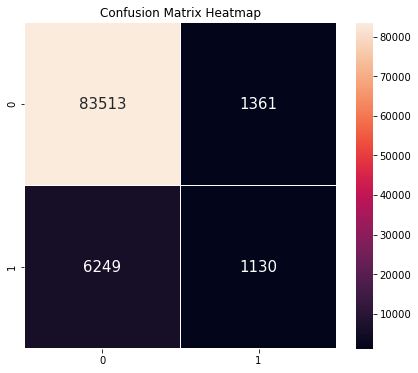

MSE :  0.08249054231298711
RMSE :  0.28721166813517013
Score Roc:  0.5685508732230298
Score de Rappel: 0.15313728147445455
Score de Precision: 0.45363307908470496

FBeta_Score:
Mesure F: 0.22897669706180346
Mesure F05: 0.3257798535432163
Mesure F2: 0.17652388540006878
 
 #################################### Seuil aléatoire afin de comparer ############################################### 

Seuil:  0.82
Coût métier: 73591
Confusion Matrix of CV data:


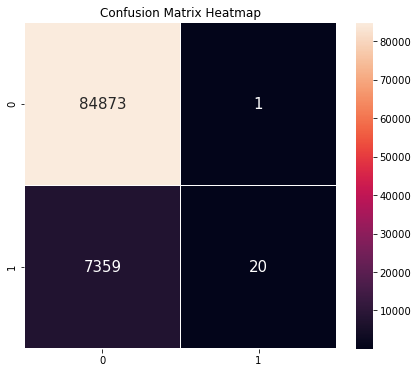

MSE :  0.07978060334081276
RMSE :  0.28245460403543216
Score Roc:  0.5013493060955806
Score de Rappel: 0.002710394362379726
Score de Precision: 0.9523809523809523

FBeta_Score:
Mesure F: 0.005405405405405405
Mesure F05: 0.01339943722363661
Mesure F2: 0.0033855841825506995
 
 #################################### Seuil aléatoire afin de comparer ############################################### 



In [190]:
for seuil in listeSeuil:    
    print("Seuil: ", seuil)
    informationModeleSeuil(y_test, seuil)
    print(' \n #################################### Seuil aléatoire afin de comparer ############################################### \n')

In [191]:
y_predSeuil = np.zeros(y_predLgbmHPSeuil.shape)
y_predSeuil[y_predLgbmHPSeuil > 0.09] = 1
coutAReduire = coutMetier(y_test, y_predSeuil)

In [192]:
coutAReduire

43483

In [193]:
y_predLgbmHPSeuilProba = lgbmHPSeuil.predict_proba(X_test)[::,1]

In [194]:
joblib.dump(y_predLgbmHPSeuilProba, r'C:\Users\Alexis\y_predLgbmHPSeuilProba.joblib')

['C:\\Users\\Alexis\\y_predLgbmHPSeuilProba.joblib']

In [195]:
joblib.dump(y_predSeuil, r'C:\Users\Alexis\y_predSeuil.joblib')

['C:\\Users\\Alexis\\y_predSeuil.joblib']

Regardons les variables les plus importantes:

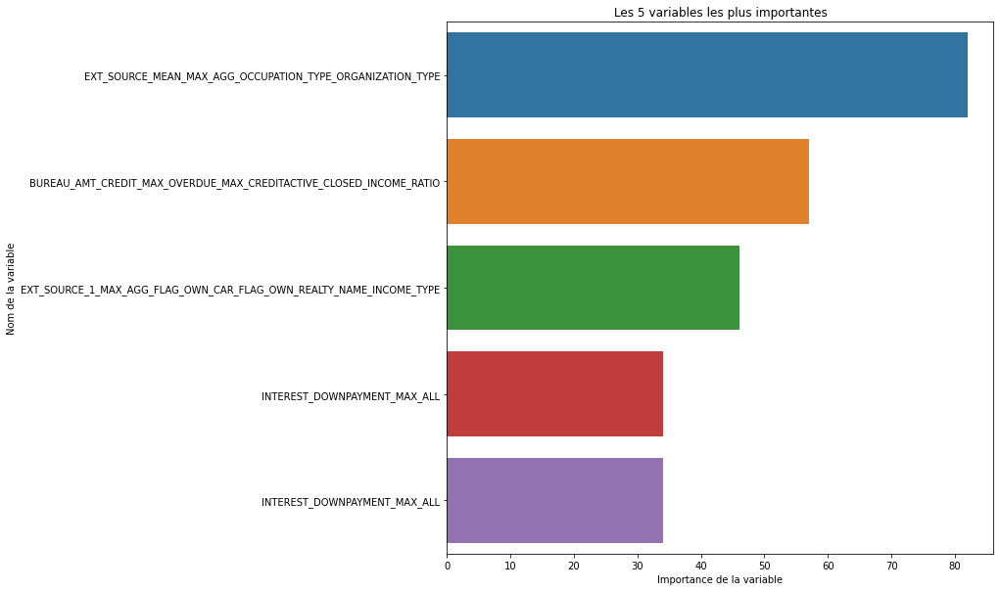

In [196]:
featureImportances = lgbmHPSeuil.feature_importances_
colonneDataframe = train_data.columns

topFeature = np.argsort(featureImportances)[::-1][:5]
topFeatureImportances = featureImportances[topFeature]
nomVariable = colonneDataframe[topFeatureImportances]
        
plt.figure(figsize = (10, 10)) 
sns.barplot(x = topFeatureImportances, y = list(range(5)), orient = 'h')
plt.yticks(list(range(5)), nomVariable)
plt.title('Les 5 variables les plus importantes')
plt.xlabel('Importance de la variable')
plt.ylabel('Nom de la variable')
plt.show()

### SHAP

La valeur de Shap proposée par Lundberg et al. [4] est la valeur SHapley Additive exPlanation. L’idée proposée par ces auteurs est de calculer la valeur de Shapley pour toutes les variables à chaque exemple du dataset. Cette approche explique la sortie d’un modèle par la somme des effets φi de chaque variable Xi. Ils se basent sur la valeur de Shapley qui provient de la théorie des jeux. L’idée est de moyenner l’impact qu’une variable a pour toutes les combinaisons de variables possibles. 

Ils ont démontré que cette approche respectait les trois propriétés suivantes :

    • Additivité : la somme des effets des variables est égale à la prédiction du modèle pour tous les exemples.
    
    • Variables nulles sans effet : si une variable de l’exemple considéré est à zéro, alors la variable ne doit pas avoir     d’impact pour cet exemple.
    
    • Cohérence : si un modèle change, tel que l’effet d’une variable est plus important sur le modèle, l’attribution           assignée à cette variable ne doit pas baisser.
    
En rouge, les variables qui ont un impact positif (contribuent à ce que la prédiction soit plus élevée que la valeur de base, dans notre cas les dossiers remboursés) et, en bleu, celles ayant un impact négatif (contribuent à ce que la prédiction soit plus basse que la valeur de base, dans notre cas les dossiers non remboursés).

In [197]:
import shap

# print the JS visualization code to the notebook
shap.initjs()

In [198]:
X_testNewName = X_test.copy()

In [199]:
X_testNewName.rename(columns = {'TARGET_NEIGHBORS_500_MEAN':'Clients similaires (durée de remboursement du crédit)', 'EXT_SOURCE_MEAN':'Moyenne des différents scores de sources extérieures', 'DAYS_PAYMENT_RATIO_MAX_MEAN':'Délai de paiement', 'INTEREST_SHARE_MAX_ALL':'Intérêt du crédit', 'EXT_SOURCE_MUL':'Multiplication des différents scores de sources extérieures'}, inplace=True)

In [200]:
explainer = shap.TreeExplainer(lgbmGrid)
shap_values = explainer.shap_values(X_testNewName)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


In [201]:
shap_values1 = shap_values[1]
joblib.dump(shap_values1, r'C:\Users\Alexis\shap_values1.joblib')

['C:\\Users\\Alexis\\shap_values1.joblib']

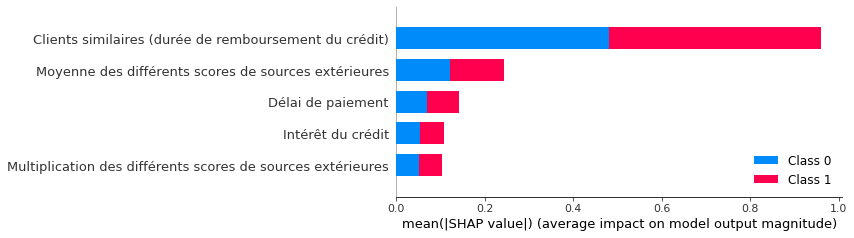

In [202]:
shap.summary_plot(shap_values, X_testNewName, max_display = 5)

Nous allons maintenant récupérer les meilleures features ainsi que leurs scores pour la suite du projet, notamment pour le dashboard:

In [204]:
shap_sum = np.abs(shap_values[1]).mean(axis=0)
importance_df = pd.DataFrame([X_test.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['column_name', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

,column_name,shap_importance
473,TARGET_NEIGHBORS_500_MEAN,0.480078
551,EXT_SOURCE_MEAN,0.122324
467,DAYS_PAYMENT_RATIO_MAX_MEAN,0.071196
36,INTEREST_SHARE_MAX_ALL,0.053762
121,EXT_SOURCE_MUL,0.051871
399,CURRENT_CREDIT_DEBT_DIFF_MIN_CREDITACTIVE_ACTIVE,0.05072
256,NUM_INSTALMENT_VERSION_SUM_LAST_1_YEAR,0.048843
645,WEIGHTED_EXT_SOURCE,0.04588
724,CREDIT_GOODS_DIFF,0.044795
940,NAME_EDUCATION_TYPE_0,0.042086


In [205]:
indexVariableImportante = importance_df.copy()

In [206]:
joblib.dump(indexVariableImportante, r'C:\Users\Alexis\indexVariableImportante.joblib')

['C:\\Users\\Alexis\\indexVariableImportante.joblib']

In [207]:
shap_sum = np.abs(shap_values[0]).mean(axis=0)
importance_df = pd.DataFrame([X_test.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['column_name', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

,column_name,shap_importance
473,TARGET_NEIGHBORS_500_MEAN,0.480078
551,EXT_SOURCE_MEAN,0.122324
467,DAYS_PAYMENT_RATIO_MAX_MEAN,0.071196
36,INTEREST_SHARE_MAX_ALL,0.053762
121,EXT_SOURCE_MUL,0.051871
399,CURRENT_CREDIT_DEBT_DIFF_MIN_CREDITACTIVE_ACTIVE,0.05072
256,NUM_INSTALMENT_VERSION_SUM_LAST_1_YEAR,0.048843
645,WEIGHTED_EXT_SOURCE,0.04588
724,CREDIT_GOODS_DIFF,0.044795
940,NAME_EDUCATION_TYPE_0,0.042086


In [232]:
importance_dfclassement = importance_df.copy()

In [233]:
importance_dfclassement = importance_dfclassement.reset_index()
importance_dfclassement.drop('index', axis = 1, inplace = True)

In [234]:
importance_dfclassement

,column_name,shap_importance
0,TARGET_NEIGHBORS_500_MEAN,0.480078
1,EXT_SOURCE_MEAN,0.122324
2,DAYS_PAYMENT_RATIO_MAX_MEAN,0.071196
3,INTEREST_SHARE_MAX_ALL,0.053762
4,EXT_SOURCE_MUL,0.051871
5,CURRENT_CREDIT_DEBT_DIFF_MIN_CREDITACTIVE_ACTIVE,0.05072
6,NUM_INSTALMENT_VERSION_SUM_LAST_1_YEAR,0.048843
7,WEIGHTED_EXT_SOURCE,0.04588
8,CREDIT_GOODS_DIFF,0.044795
9,NAME_EDUCATION_TYPE_0,0.042086


In [211]:
joblib.dump(importance_dfclassement, r'C:\Users\Alexis\importance_dfclassement.joblib')

['C:\\Users\\Alexis\\importance_dfclassement.joblib']

In [235]:
importance_dfclassementTop5 = importance_dfclassement.head(5)

In [236]:
importance_dfclassementTop5

,column_name,shap_importance
0,TARGET_NEIGHBORS_500_MEAN,0.480078
1,EXT_SOURCE_MEAN,0.122324
2,DAYS_PAYMENT_RATIO_MAX_MEAN,0.071196
3,INTEREST_SHARE_MAX_ALL,0.053762
4,EXT_SOURCE_MUL,0.051871


In [237]:
map_prediction = {'TARGET_NEIGHBORS_500_MEAN':'Clients similaires (durée de remboursement du crédit)',
                  'EXT_SOURCE_MEAN':'Moyenne des différents scores de sources extérieures', 
                  'DAYS_PAYMENT_RATIO_MAX_MEAN':'Délai de paiement', 
                  'INTEREST_SHARE_MAX_ALL':'Intérêt du crédit', 
                  'EXT_SOURCE_MUL':'Multiplication des différents scores de sources extérieures'} 

importance_dfclassementTop5['column_name'] = importance_dfclassementTop5['column_name'].map(map_prediction)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [238]:
importance_dfclassementTop5

,column_name,shap_importance
0,Clients similaires (durée de remboursement du crédit),0.480078
1,Moyenne des différents scores de sources extérieures,0.122324
2,Délai de paiement,0.071196
3,Intérêt du crédit,0.053762
4,Multiplication des différents scores de sources extérieures,0.051871


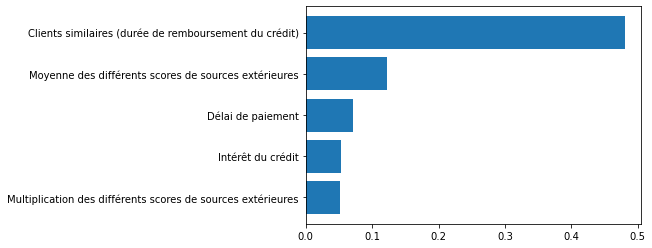

In [239]:
x = importance_dfclassementTop5.sort_values('shap_importance')['column_name']
y = importance_dfclassementTop5.sort_values('shap_importance')['shap_importance']

plt.figure(figsize=(6,4))
plt.barh(x, y)
plt.show()

In [212]:
explainer.expected_value

[2.9369667543399736, -2.9369667543399736]

In [213]:
shap.force_plot(explainer.expected_value[1], shap_values[1][0], X_test.iloc[[0]])

### LIME

LIME (Local Interpretable Model-agnostic Explanation) fournit une méthode rapide et relativement simple pour expliquer localement les modèles. 

L'algorithme LIME peut être simplifié en quelques étapes:

    • Pour un point de données donné, perturber aléatoirement ses caractéristiques à plusieurs reprises. Pour nos données       cela implique d'ajouter une petite quantité de bruit à chaque feature.

    • Obtenez des prédictions pour chaque instance de données perturbée. Cela nous aide à construire une image locale de la     surface de décision à ce point.

    • Utilisez des prédictions pour calculer un "explanation model" linéaire approximatif à l'aide de prédictions. Les         coefficients du modèle linéaire sont utilisés comme explications.

In [214]:
#!pip install lime

In [215]:
import lime
from lime import lime_tabular

In [216]:
explainer = lime_tabular.LimeTabularExplainer(X_train.values, 
                feature_names = X_train.columns.values.tolist(),
                verbose = True,
                mode = "classification")

In [217]:
explainer

In [218]:
import random
idx = random.randint(1, len(X_test))

expLGBM = explainer.explain_instance(X_test.values[idx], lgbmGrid.predict_proba, num_features = len(X_test.columns.values.tolist()))
expLGBM.show_in_notebook(show_table=True)

Intercept 0.235900730118268
Prediction_local [0.01246549]
Right: 0.0338485933334013


Nous pouvons maintenant passer à la suite, en réalisant notamment le dashboard.